In [7]:
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
rcParams['figure.figsize'] = (7,7)

import random



# Import deepscore model # Add deepscore folder to path
# from deepscore import deepscore 
import pickle

In [ ]:
adata = sc.read('/home/macera/Documentos/CZI/MANUSCRIPT_PREP/REVIEWS/external_data/reck/rna.h5ad') # Reck et. al. 2025

/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [6]:
adata = adata.raw.to_adata()
adata.X.data

array([1., 1., 1., ..., 2., 2., 1.], dtype=float32)

In [7]:
adata.obs['suspension_type']

l1_AAACAGCCATCAATCG-1    nucleus
l1_AAACAGCCATTGCAGC-1    nucleus
l1_AAACCGAAGACAAACG-1    nucleus
l1_AAACCGAAGTAATCCA-1    nucleus
l1_AAACCGAAGTGTGATC-1    nucleus
                          ...   
l6_TTTAGCTTCGCTAGCA-1    nucleus
l6_TTTCGTCCACAGGGAC-1    nucleus
l6_TTTGAGTCAGGAACTG-1    nucleus
l6_TTTGCATTCGCTCACT-1    nucleus
l6_TTTGTGTTCATGCTTT-1    nucleus
Name: suspension_type, Length: 46957, dtype: category
Categories (1, object): ['nucleus']

In [8]:
adata.obs['donor_id']

l1_AAACAGCCATCAATCG-1    obstructed_2
l1_AAACAGCCATTGCAGC-1    obstructed_2
l1_AAACCGAAGACAAACG-1    obstructed_2
l1_AAACCGAAGTAATCCA-1    obstructed_2
l1_AAACCGAAGTGTGATC-1    obstructed_2
                             ...     
l6_TTTAGCTTCGCTAGCA-1        normal_6
l6_TTTCGTCCACAGGGAC-1        normal_6
l6_TTTGAGTCAGGAACTG-1        normal_6
l6_TTTGCATTCGCTCACT-1        normal_6
l6_TTTGTGTTCATGCTTT-1        normal_6
Name: donor_id, Length: 46957, dtype: category
Categories (12, object): ['normal_1', 'normal_2', 'normal_3', 'normal_4', ..., 'obstructed_2', 'obstructed_3', 'obstructed_4', 'obstructed_5']

In [10]:
metadata = pd.read_csv('/home/macera/Documentos/CZI/MANUSCRIPT_PREP/REVIEWS/external_data/reck/GSE254185_cell_meta_data.tsv.gz', sep='\t', index_col=0)

In [11]:
metadata['prefix'] = [i.split('_')[0] for i in metadata.index]

In [12]:
metadata.columns

Index(['Sample', 'Library', 'SampleXLibrary', 'Sex', 'Annotation.Lvl1',
       'Annotation.Lvl2', 'UMAP_1', 'UMAP_2', 'prefix'],
      dtype='object')

In [13]:
metadata['prefix'].unique()

array(['l1', 'l2', 'l3', 'l4', 'l5', 'l6'], dtype=object)

In [17]:
import mygene

def add_symbols_to_adata(adata, id_col=None):
    """
    Add HGNC gene symbols to `adata.var`.

    Parameters
    ----------
    adata : AnnData
        Your AnnData object with Ensembl gene IDs.
    id_col : str or None
        Column in adata.var containing Ensembl IDs.
        If None, will use adata.var_names.

    Returns
    -------
    AnnData
        Modified AnnData with `adata.var["gene_symbols"]`
    """
    mg = mygene.MyGeneInfo()
    ids = adata.var[id_col] if id_col else adata.var_names

    out = mg.querymany(
        ids.tolist(),
        scopes="ensembl.gene",
        fields="symbol",
        species="human"
    )

    # Build mapping
    mapping = {r["query"]: r.get("symbol", None) for r in out}
    adata.var["gene_symbols"] = [mapping.get(g, None) for g in ids]

    return adata

adata = add_symbols_to_adata(adata)

Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed
22 input query terms found dup hits:	[('ENSG00000228044', 2), ('ENSG00000226506', 2), ('ENSG00000261600', 2), ('ENSG00000234162', 2), ('E
641 input query terms found no hit:	['ENSG00000238009', 'ENSG00000230699', 'ENSG00000236948', 'ENSG00000226849', 'ENSG00000272482', 'ENS


In [ ]:
keep = adata.var["gene_symbols"].notna()
adata = adata[:, keep].copy()

In [19]:
adata.var.index = adata.var['gene_symbols']

In [20]:
adata.var_names_make_unique()

In [21]:
adata.var.index.name = None

In [22]:
adata.write('/home/macera/Documentos/CZI/MANUSCRIPT_PREP/REVIEWS/external_data/reck/rna_ready.h5ad', compression='gzip')

In [1]:
import scanpy as sc
adata = sc.read('/home/macera/Documentos/CZI/MANUSCRIPT_PREP/REVIEWS/external_data/reck/rna_ready.h5ad', compression='gzip')

/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [3]:
import matplotlib.pyplot as plt

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
rcParams['figure.figsize'] = (12,12)


import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
import matplotlib.patheffects as path_effects


sc.settings.verbosity =0

def adjust_labels(coordinates, label_size, scale_factor,categories, max_iterations=5, displacement=1, neighborhood_radius=1.0):
    """
    Adjust label positions to minimize overlaps by moving labels towards areas of lower density.
    Once a label's position is adjusted and it has no overlaps, its position is fixed.

    :param coordinates: numpy array of shape (n_labels, 2) with initial label coordinates.
    :param label_sizes: numpy array of shape (n_labels, 2) with width and height of each label.
    :param scale_factor: scaling factor to adjust label sizes to UMAP coordinate space.
    :param max_iterations: maximum number of iterations for adjustment.
    :param displacement: step size for moving labels.
    :param neighborhood_radius: radius to consider for neighborhood density.
    :return: adjusted coordinates.
    """
    fixed_labels = [False] * len(coordinates)  # Track whether a label's position is fixed

    for _ in range(max_iterations):
        for i in range(len(coordinates)):
            if fixed_labels[i]:
                continue  # Skip this label if its position is already fixed

            direction = np.zeros(2)
            has_overlap = False
            for j in range(len(coordinates)):
                if not fixed_labels[j] and i != j and check_overlap(coordinates[i], coordinates[j],label_size, scale_factor, pad = label_size +20):
                    # print(categories[i],' ', categories[j], 'OVERLAP' )
                    has_overlap = True
                    direction += coordinates[i] - coordinates[j]

            if has_overlap:
                # Normalize and move label
                if np.linalg.norm(direction) != 0:
                    direction /= np.linalg.norm(direction)
                    less_dense_direction = find_less_dense_direction(coordinates, i, neighborhood_radius)
                    direction += less_dense_direction
                    direction /= np.linalg.norm(direction)
                    coordinates[i] += direction * displacement
            else:
                fixed_labels[i] = True  # Mark this label as fixed

        # Check if all labels are fixed, and if so, break the loop
        if all(fixed_labels):
            break

    return coordinates

def check_overlap(coord1, coord2, size, scale_factor=1.0, pad = 25):
    """
    Check if two labels overlap, accounting for scale differences between UMAP coordinates and label sizes.

    :param coord1: coordinates of the first label.
    :param coord2: coordinates of the second label.
    :param size1: size of the first label.
    :param size2: size of the second label.
    :param scale_factor: scaling factor to adjust label sizes to UMAP coordinate space.
    :return: True if labels overlap, False otherwise.
    """
    distance = np.linalg.norm(coord1 - coord2) - pad/scale_factor
    adjusted_size = size / scale_factor
    return distance < adjusted_size

def find_less_dense_direction(coordinates, index, radius):
    """
    Find a direction towards a less dense area for a label.

    :param coordinates: numpy array of label coordinates.
    :param index: index of the label to move.
    :param radius: radius to consider for neighborhood density.
    :return: a unit vector pointing towards a less dense area.
    """
    center = coordinates[index]
    density_vector = np.zeros(2)
    for i, coord in enumerate(coordinates):
        if i != index and np.linalg.norm(coord - center) < radius:
            density_vector += center - coord

    if np.linalg.norm(density_vector) == 0:
        return np.random.rand(2) - 0.5  # Random direction if density is uniform
    else:
        return density_vector / np.linalg.norm(density_vector)
def label_size_to_font_size(label_size):
    # This is a placeholder function. You need to define how to convert label size to font size
    return label_size / 2 

def shorten_line(start, end, shorten_by):
    direction = end - start
    norm_direction = direction / np.linalg.norm(direction)
    return end - norm_direction * shorten_by

# VARIABLES




def umap_refined(adata,
                umap,
                var,
                 size=10,
                label_size = 50,
                width_in_inches = 18,
                height_in_inches = 18,
                max_iterations=20,
                displacement=0.5):
    x_min, y_min = np.min(adata.obsm[umap], axis=0)
    x_max, y_max = np.max(adata.obsm[umap], axis=0)

    umap_width = x_max - x_min
    umap_height = y_max - y_min


    fig = plt.figure(figsize=(width_in_inches, height_in_inches))
    dpi = fig.dpi  # Get the DPI of the figure

    # Convert figure size to pixels
    plot_width_pixels = width_in_inches * dpi
    plot_height_pixels = height_in_inches * dpi

    # You might need to adjust for margins and paddings
    # These are approximate values and might need tweaking
    left_margin = 0.1 * plot_width_pixels
    right_margin = 0.1 * plot_width_pixels
    top_margin = 0.1 * plot_height_pixels
    bottom_margin = 0.1 * plot_height_pixels

    effective_plot_width = plot_width_pixels - (left_margin + right_margin)
    effective_plot_height = plot_height_pixels - (top_margin + bottom_margin)


    scale_factor_x = effective_plot_width / umap_width
    scale_factor_y = effective_plot_height / umap_height

    # Use the smaller scale factor to maintain aspect ratio
    scale_factor = min(scale_factor_x, scale_factor_y)
    print('Figure size=',(width_in_inches, height_in_inches),'dpi=',dpi, 'Scale factor =', scale_factor)

    ax = plt.subplot()
    sc.pl.embedding(adata, basis = umap, color = [var], frameon = False, size = size, show=False, legend_fontoutline=2, ax=ax )


    label_colors = adata.uns[f'{var}_colors']
    # Get initial label positions (centroids of clusters)
    categories = adata.obs[var].cat.categories  # Replace with your category column
    initial_coords = np.array([np.median(adata.obsm[umap][adata.obs[var] == cat], axis=0) for cat in categories])
    # for i in range(len(categories)):
        # print(categories[i], initial_coords[i])
  # Replace with your estimated sizes

    adjusted_coords = adjust_labels(initial_coords.copy(), label_size, scale_factor = scale_factor,categories = categories, max_iterations=2, displacement=0.5)

    scaled_initial_coords = initial_coords 
    scaled_adjusted_coords = adjusted_coords 

    for i, cat in enumerate(categories):
        start_coord = scaled_initial_coords[i]
        end_coord = scaled_adjusted_coords[i]

        # Calculate new endpoint shortened by half the font size
        font_size = label_size_to_font_size(label_size / 2)
        new_end_coord = shorten_line(start_coord, end_coord, font_size/scale_factor)

        # Draw line
        ax.plot([start_coord[0], new_end_coord[0]], 
                [start_coord[1], new_end_coord[1]], 
                color='black', linestyle='-', linewidth=1,)

        # Plot label
        text = ax.text(end_coord[0], end_coord[1], cat, 
                       ha='center', va='center', 
                       fontsize=font_size, color=label_colors[i])

        # Add black outline to text
        text.set_path_effects([path_effects.Stroke(linewidth=4, foreground='white'),
                               path_effects.Stroke(linewidth=2, foreground='black'),
                               path_effects.Normal()])
        



# Supp Fig 13

Figure size= (18, 18) dpi= 100.0 Scale factor = 42.799631831475146


/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_222110/3880658012.py:102: RuntimeWarning: invalid value encountered in divide
  norm_direction = direction / np.linalg.norm(direction)


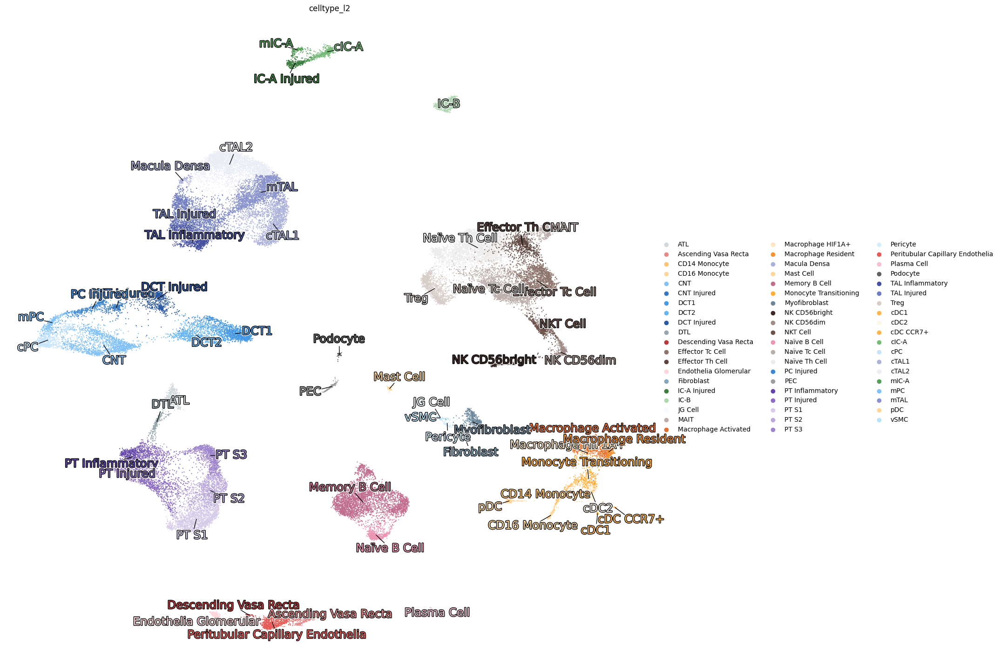

In [9]:
umap_refined(adata,
                'X_umap',
                'celltype_l2',
                 size=10,
                label_size = 70,
                width_in_inches = 18,
                height_in_inches = 18,
                max_iterations=5,
                displacement=3)
plt.savefig('Umap_Reck_scRNA_ct_l2.png', dpi=400, bbox_inches='tight')

Figure size= (8, 8) dpi= 100.0 Scale factor = 19.02205859176673


/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_222110/3880658012.py:102: RuntimeWarning: invalid value encountered in divide
  norm_direction = direction / np.linalg.norm(direction)


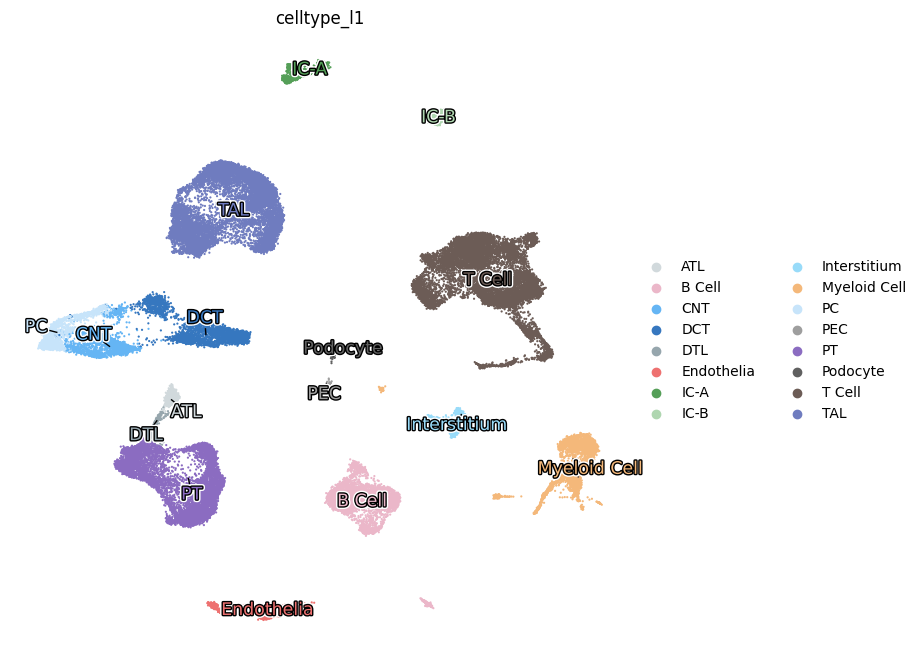

In [12]:
umap_refined(adata,
                'X_umap',
                'celltype_l1',
                 size=10,
                label_size = 50,
                width_in_inches = 8,
                height_in_inches = 8,
                max_iterations=5,
                displacement=3)
plt.savefig('Umap_Reck_scRNA_ct_l1.png', dpi=400, bbox_inches='tight')

In [2]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [ ]:
adata.var.loc['PDGFRA']

features               ENSG00000134853
feature_is_filtered              False
feature_name                    PDGFRA
feature_reference       NCBITaxon:9606
feature_biotype                   gene
feature_length                     958
feature_type            protein_coding
gene_symbols                    PDGFRA
Name: PDGFRA, dtype: object

In [4]:
sc.tl.score_genes(adata, ['DCN','PDGFRA','TIMP1','CFD'], score_name='sig_NORN', use_raw=False)
sc.tl.score_genes(adata, gene_list=['WFDC2','B2M','TMSB10','CLU','TACSTD2'], score_name='sig_aTAL1_0', use_raw=False)

In [36]:
rcParams['figure.figsize'] = (3,4)


In [13]:
adata.obs['disease'].value_counts()

disease
obstructive nephropathy    31817
normal                     15140
Name: count, dtype: int64

In [18]:
adata.obs['donor_id'].value_counts()

donor_id
obstructed_4    9189
obstructed_5    8466
obstructed_3    5416
obstructed_2    4775
normal_2        3973
obstructed_1    3971
normal_7        3513
normal_4        2260
normal_6        1951
normal_5        1831
normal_1        1169
normal_3         443
Name: count, dtype: int64

In [14]:
import scipy.stats as stats
import pandas as pd

# Example: assume
#   adata.obs["signature_score"] = your score
#   adata.obs["condition"] = "treated"/"control"

score = adata.obs["sig_NORN"]
cond = adata.obs["disease"]

# split groups
group1 = score[cond == "obstructive nephropathy"]
group2 = score[cond == "normal"]

# Mann–Whitney U test (two-sided)
u_stat, p_val = stats.mannwhitneyu(group1, group2, alternative="two-sided")
print(f"Mann–Whitney U: {u_stat:.2f}, p-value: {p_val:.3e}")

Mann–Whitney U: 276217154.50, p-value: 3.298e-147


In [ ]:
sc.pl.violin(adata[adata.obs['celltype_l1'].isin(['Interstitium'])], keys='sig_NORN', groupby='disease', )
df = adata[adata.obs['celltype_l1'].isin(['Interstitium'])].obs.groupby(["donor_id", "disease"])["sig_NORN"].median().reset_index()
df = df.dropna(subset=["sig_NORN"])

# balanced test at donor level
treated = df.loc[df["disease"] == "obstructive nephropathy", "sig_NORN"]
control = df.loc[df["disease"] == "normal", "sig_NORN"]

from scipy.stats import mannwhitneyu
u, p = mannwhitneyu(treated, control, alternative="two-sided")
print(f"Sample-level test: U={u:.2f}, p={p:.3e}")

Sample-level test: U=27.00, p=1.490e-01


/tmp/ipykernel_7606/4129113686.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = adata[adata.obs['celltype_l1'].isin(['Interstitium'])].obs.groupby(["donor_id", "disease"])["sig_NORN"].median().reset_index()


In [51]:
treated

14    0.192978
16    0.225404
18    0.278773
20    0.189128
22    0.165652
Name: sig_NORN, dtype: float64

In [50]:
control

1     0.150670
3     0.190886
5     0.131147
7     0.220498
9     0.106998
11    0.212588
13    0.000000
Name: sig_NORN, dtype: float64

In [ ]:
sc.pl.violin(adata[adata.obs['celltype_l1'].isin(['TAL'])], keys='sig_aTAL1_0', groupby='disease', )

df = adata[adata.obs['celltype_l1'].isin(['TAL'])].obs.groupby(["donor_id", "disease"])["sig_aTAL1_0"].median().reset_index()
df = df.dropna(subset=["sig_aTAL1_0"])

# balanced test at donor level
treated = df.loc[df["disease"] == "obstructive nephropathy", "sig_aTAL1_0"]
control = df.loc[df["disease"] == "normal", "sig_aTAL1_0"]

from scipy.stats import mannwhitneyu
u, p = mannwhitneyu(treated, control, alternative="two-sided")
print(f"Sample-level test: U={u:.2f}, p={p:.3e}")

Sample-level test: U=34.00, p=5.051e-03


/tmp/ipykernel_7606/3106178850.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = adata[adata.obs['celltype_l1'].isin(['TAL'])].obs.groupby(["donor_id", "disease"])["sig_aTAL1_0"].median().reset_index()


/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


Balanced counts — normal: 228, obstructive nephropathy: 228
Mann–Whitney U: 22124.50, p-value: 5.983e-03 (**)


/tmp/ipykernel_7606/3492061024.py:104: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


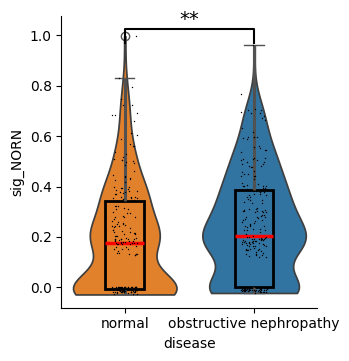

In [64]:
"""
Balanced violin + boxplot overlay with Mann–Whitney test and significance annotation.

- Subsamples groups to equal cell counts
- Runs two-sided Mann–Whitney U test
- Plots violin (Scanpy) + thin box overlay (Seaborn)
- Adds significance bar with stars
- Saves figure
"""

import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu
from matplotlib import rcParams

rcParams["figure.figsize"] = (3.8, 4)


def balanced_violin_boxplot(
    adata,
    celltype: str,
    group_key: str = "disease",
    score_key: str = "sig_NORN",
    group_order=("normal", "obstructive nephropathy"),
    outfile="violin_box_condition_norn.png",
    seed=0,
):
    """Subset cells, balance groups, test, and plot violin+box."""

    # 1) Subset by cell type
    adata_sub = adata[adata.obs["celltype_l1"] == celltype].copy()

    # 2) Balance groups by random subsampling
    np.random.seed(seed)
    g1_cells = adata_sub.obs.query(f"{group_key} == '{group_order[0]}'").index.to_numpy()
    g2_cells = adata_sub.obs.query(f"{group_key} == '{group_order[1]}'").index.to_numpy()

    if len(g1_cells) == 0 or len(g2_cells) == 0:
        raise ValueError("Both groups must contain cells.")

    target_n = min(len(g1_cells), len(g2_cells))
    g1_sub = np.random.choice(g1_cells, size=target_n, replace=False)
    g2_sub = np.random.choice(g2_cells, size=target_n, replace=False)

    balanced_idx = np.concatenate([g1_sub, g2_sub])
    adata_balanced = adata_sub[balanced_idx].copy()

    # 3) Mann–Whitney U test
    g1_scores = adata_balanced.obs.loc[adata_balanced.obs[group_key] == group_order[0], score_key].astype(float)
    g2_scores = adata_balanced.obs.loc[adata_balanced.obs[group_key] == group_order[1], score_key].astype(float)

    u, p = mannwhitneyu(g1_scores, g2_scores, alternative="two-sided")

    # 4) Violin plot
    sc.pl.violin(
        adata_balanced,
        keys=score_key,
        groupby=group_key,
        order=group_order,
        cut=0,
        show=False,rotation=0.0003
    )
    ax = plt.gca()

    # 5) Overlay thin boxplot
    sns.boxplot(
        x=group_key,
        y=score_key,
        data=adata_balanced.obs,
        order=group_order,
        width=0.3,
        showcaps=True,  # no whisker caps
        boxprops={"facecolor": "none", "edgecolor": "black", "linewidth": 2},
        whiskerprops={"linewidth": 2.2},
        medianprops={"color": "red", "linewidth": 2.5},
        ax=ax
        )


    # 6) Significance annotation
    ymin, ymax = ax.get_ylim()
    h = 0.05 * (ymax - ymin)
    y = ymax - 0.02 * (ymax - ymin) - h
    x1, x2 = 0, 1
    ax.plot([x1, x1, x2, x2], [y, y + h, y + h, y], lw=1.5, c="k")

    if p < 0.001:
        stars = "***"
    elif p < 0.01:
        stars = "**"
    elif p < 0.05:
        stars = "*"
    else:
        stars = "n.s."

    ax.text((x1 + x2) / 2, y + h, stars, ha="center", va="bottom", fontsize=14)

    # 7) Clean aesthetics
    for spine in ["top", "right"]:
        ax.spines[spine].set_visible(False)

    plt.tight_layout()
    plt.savefig(outfile, dpi=300)

    print(f"Balanced counts — {group_order[0]}: {len(g1_sub)}, {group_order[1]}: {len(g2_sub)}")
    print(f"Mann–Whitney U: {u:.2f}, p-value: {p:.3e} ({stars})")


# -----------------------------
# Run for Interstitium cells
# -----------------------------
balanced_violin_boxplot(
    adata,
    celltype="Interstitium",
    group_key="disease",
    score_key="sig_NORN",
    group_order=("normal", "obstructive nephropathy"),
    outfile="violin_box_condition_norn.png",
    seed=0,
)


/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(
/tmp/ipykernel_7606/68096275.py:101: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Balanced counts — normal: 4806, obstructive nephropathy: 4806
Mann–Whitney U: 7503616.50, p-value: 2.450e-194  (***)


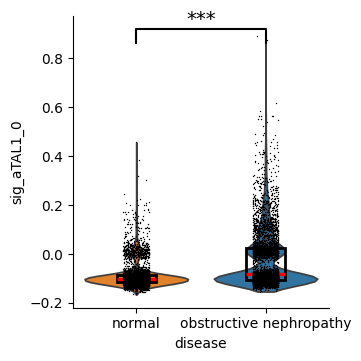

In [75]:
"""
Balanced violin (+ thin box without fliers) with Mann–Whitney test for TAL cells.
"""

import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu
from matplotlib import rcParams

rcParams["figure.figsize"] = (3.8, 4)

# -----------------------------
# Parameters
# -----------------------------
celltype   = "TAL"
group_key  = "disease"
score_key  = "sig_aTAL1_0"
order      = ("normal", "obstructive nephropathy")
outfile    = "violin_box_condition_tal.png"
seed       = 0
overlay_box = True   # toggle box overlay

# -----------------------------
# 1) Subset to TAL cells
# -----------------------------
adata_sub = adata[adata.obs['celltype_l1'] == celltype].copy()

# -----------------------------
# 2) Subsample to balance groups
# -----------------------------
np.random.seed(seed)
g1_cells = adata_sub.obs.query(f"{group_key} == '{order[0]}'").index.to_numpy()
g2_cells = adata_sub.obs.query(f"{group_key} == '{order[1]}'").index.to_numpy()

if len(g1_cells) == 0 or len(g2_cells) == 0:
    raise ValueError("Both groups must have at least one cell.")

target_n = min(len(g1_cells), len(g2_cells))
g1_sub = np.random.choice(g1_cells, size=target_n, replace=False)
g2_sub = np.random.choice(g2_cells, size=target_n, replace=False)

balanced_idx = np.concatenate([g1_sub, g2_sub])
adata_balanced = adata_sub[balanced_idx].copy()

# -----------------------------
# 3) Mann–Whitney test
# -----------------------------
g1_scores = adata_balanced.obs.loc[adata_balanced.obs[group_key] == order[0], score_key].astype(float)
g2_scores = adata_balanced.obs.loc[adata_balanced.obs[group_key] == order[1], score_key].astype(float)
u, p = mannwhitneyu(g1_scores, g2_scores, alternative="two-sided")

# -----------------------------
# 4) Violin plot
# -----------------------------
sc.pl.violin(
    adata_balanced,
    keys=score_key,
    groupby=group_key,
    order=order,
    cut=0,
    show=False,
)
ax = plt.gca()

# Optional: thin box overlay without outlier dots
if overlay_box:
    sns.boxplot(
        x=group_key, y=score_key, data=adata_balanced.obs, order=order,
        width=0.3, showcaps=False, showfliers=False,  # 🔹 hide fliers
        boxprops={"facecolor": "none", "edgecolor": "black", "linewidth": 2.0},
        whiskerprops={"linewidth": 2.0},
        medianprops={"color": "red", "linewidth": 2.4},
        ax=ax
    )

# -----------------------------
# 5) Significance bracket + stars
# -----------------------------
ymin, ymax = ax.get_ylim()
h = 0.05 * (ymax - ymin)
y = ymax - 0.02 * (ymax - ymin) - h
x1, x2 = 0, 1
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c="k")

if p < 0.001:
    stars = "***"
elif p < 0.01:
    stars = "**"
elif p < 0.05:
    stars = "*"
else:
    stars = "n.s."
ax.text((x1 + x2) / 2, y + h, stars, ha="center", va="bottom", fontsize=14)

# Clean aesthetics
for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)

plt.tight_layout()
plt.savefig(outfile, dpi=300)

print(f"Balanced counts — {order[0]}: {len(g1_sub)}, {order[1]}: {len(g2_sub)}")
print(f"Mann–Whitney U: {u:.2f}, p-value: {p:.3e}  ({stars})")


/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Tr

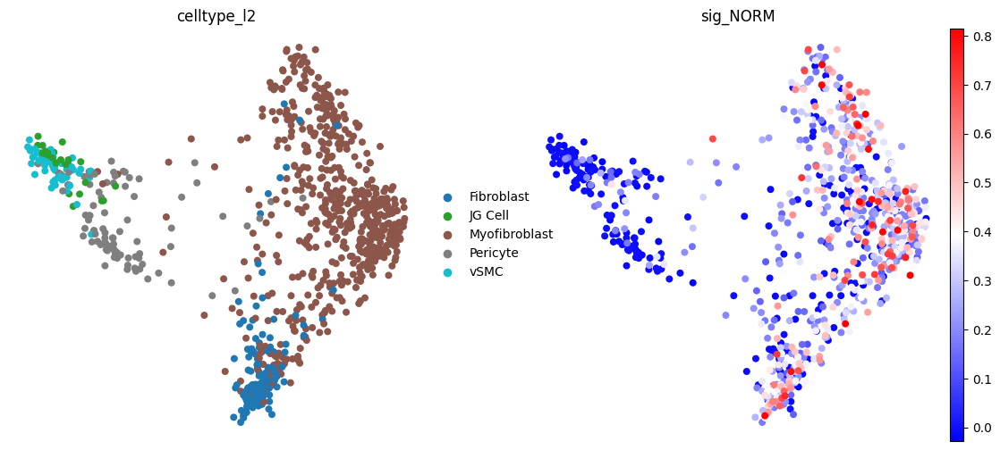

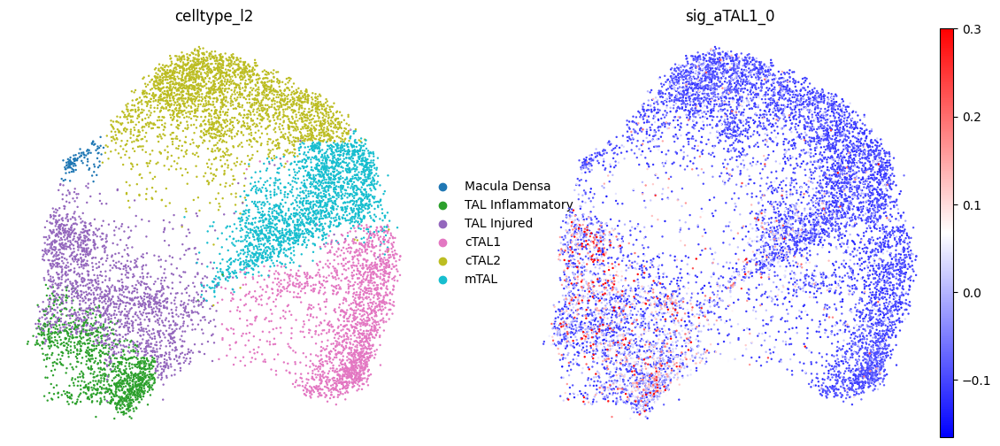

In [32]:
rcParams['figure.figsize'] = (6,6)

sc.pl.umap(adata[adata.obs['celltype_l1'].isin(['Interstitium'])], color=['celltype_l2','sig_NORM'],vmax='p99', ncols=2,cmap='bwr', show=False,frameon=False, palette='tab10')
plt.savefig('umap_FIB_signatures.png', dpi=400, bbox_inches='tight')
plt.savefig('umap_FIB_signatures.pdf', dpi=400, bbox_inches='tight')
sc.pl.umap(adata[adata.obs['celltype_l1'].isin(['TAL'])], color=['celltype_l2','sig_aTAL1_0'], vmax='p99',ncols=2, frameon=False,cmap='bwr',show=False, palette='tab10')
plt.savefig('umap_TAL_signatures.png', dpi=400, bbox_inches='tight')
plt.savefig('umap_TAL_signatures.pdf', dpi=400, bbox_inches='tight')

/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(

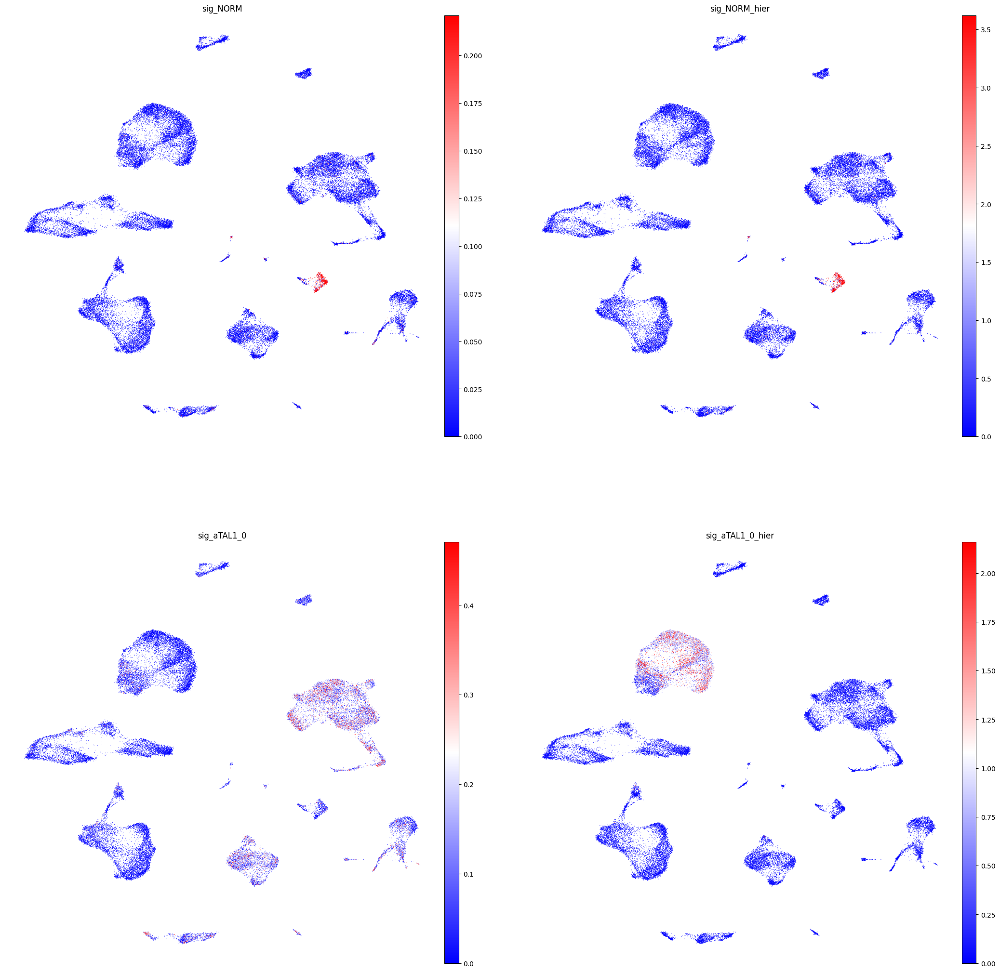

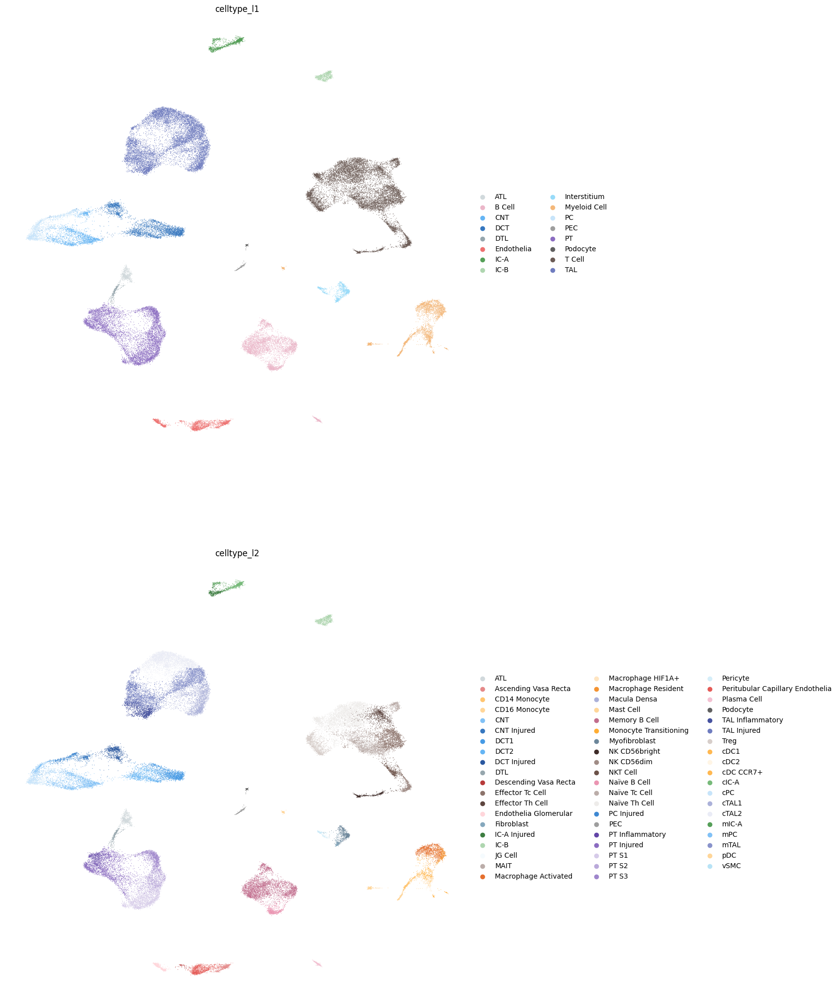

/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


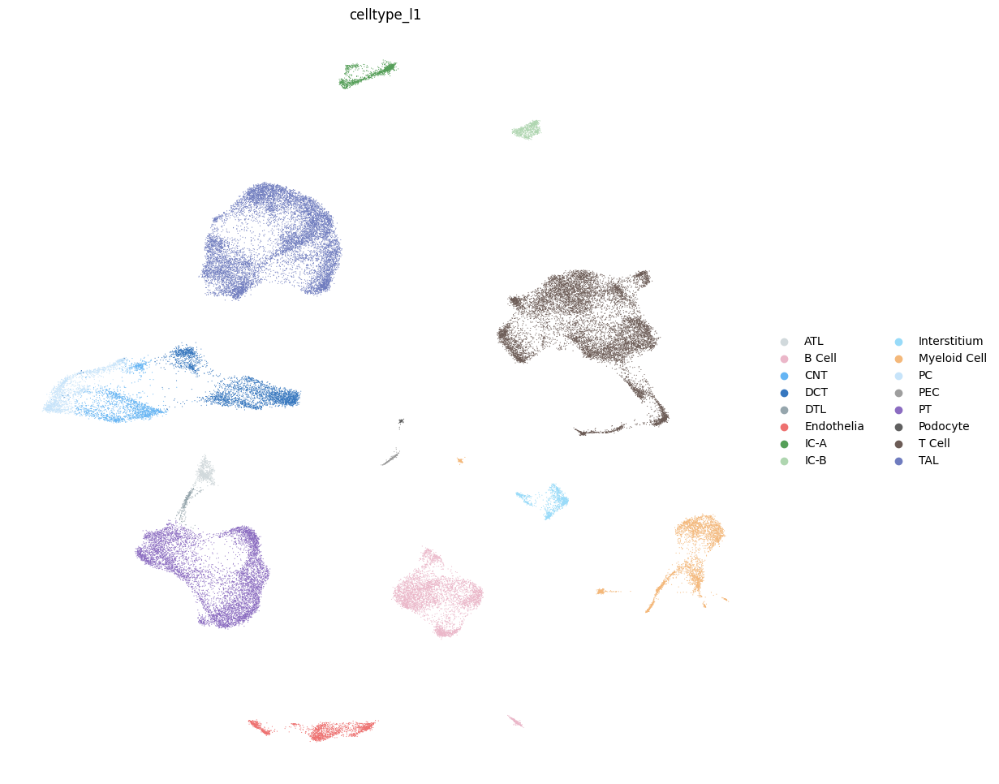

/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


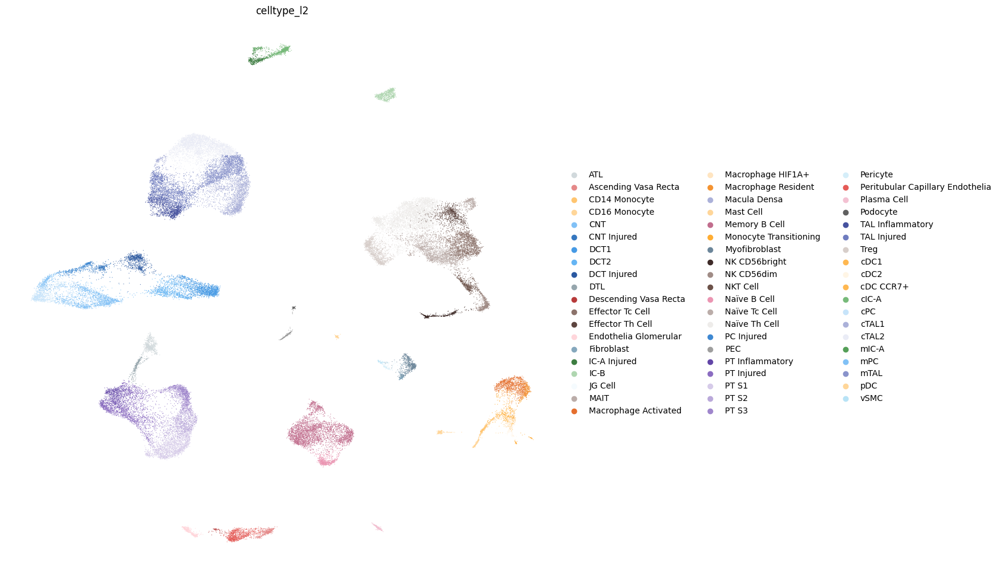

In [27]:
# sc.pl.umap(adata, color=['celltype_l1','celltype_l2','sig_NORM_hier', 'sig_NORM_hier'],vmax='p99', ncols=2, frameon=False)
sc.pl.umap(adata, color=['sig_NORM', 'sig_NORM_hier','sig_aTAL1_0','sig_aTAL1_0_hier'], vmax='p99', cmap='bwr',vmin=0,ncols=2, frameon=False, show=False)
plt.savefig('umap_full_signatures.png', dpi=400, bbox_inches='tight')
plt.savefig('umap_full_signatures.pdf', dpi=400, bbox_inches='tight')
sc.pl.umap(adata, color=['celltype_l1','celltype_l2'], vmax='p100', cmap='magma_r',vmin=0,ncols=1, frameon=False, show=False)
plt.savefig('umap_full_celltype.png', dpi=400, bbox_inches='tight')
plt.savefig('umap_full_celltype.pdf', dpi=400, bbox_inches='tight')
plt.show()
sc.pl.umap(adata, color=['celltype_l1'], vmax='p100', cmap='magma_r',vmin=0,ncols=1, frameon=False, show=False)
plt.savefig('umap_full_celltype_l1.png', dpi=400, bbox_inches='tight')
plt.savefig('umap_full_celltype_l1.pdf', dpi=400, bbox_inches='tight')
plt.show()
sc.pl.umap(adata, color=['celltype_l2'], vmax='p100', cmap='magma_r',vmin=0,ncols=1, frameon=False, show=False)
plt.savefig('umap_full_celltype_l2.png', dpi=400, bbox_inches='tight')
plt.savefig('umap_full_celltype_l2.pdf', dpi=400, bbox_inches='tight')
plt.show()


# Supp Fig 15

# LOAD scOMM Annotations

In [ ]:
adata

AnnData object with n_obs × n_vars = 46957 × 23368
    obs: 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'self_reported_ethnicity_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'tissue_type', 'tissue_ontology_term_id', 'library_id', 'celltype_l1', 'celltype_l2', 'n_umi', 'n_genes', 'percent_mitochrondrial', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'features', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type', 'gene_symbols'
    uns: 'celltype_l1_colors', 'celltype_l2_colors', 'citation', 'default_embedding', 'organism', 'organism_ontology_term_id', 'schema_reference', 'schema_version', 'title'
    obsm: 'X_umap'
    obsp: 'distances'

In [ ]:
# --- Imports ---
import scanpy as sc
import pandas as pd
import os


# --- Load celltype (level 1) results ---
celltype_csv = os.path.join(csv_dir, "Deepscore_HCA_l1_RECK_CLEAN.csv")
df_celltype = pd.read_csv(celltype_csv, index_col=0)

adata.obs.loc[df_celltype.index, "scOMM_Celltype"] = df_celltype["Deepscore_HCA"]
adata.obs.loc[df_celltype.index, "scOMM_Celltype_score"] = df_celltype["Deepscore_HCA_score"]

# Align indices with adata
common_idx = adata.obs_names.intersection(df_celltype.index)
cellstate_df = []

for fname in os.listdir(csv_dir):
    if fname.startswith("Deepscore_HCA_l3_") and fname.endswith(".csv"):
        fpath = os.path.join(csv_dir, fname)
        df_state = pd.read_csv(fpath, index_col=0)

        # Extract celltype name from filename
        celltype_name = fname.replace("Deepscore_HCA_l3_", "").replace(".csv", "")

        # Align indices
        common_idx = adata.obs_names.intersection(df_state.index)

        # Build temporary df with aligned index
        tmp = pd.DataFrame({
            "cell_id": common_idx,
            "state": df_state.loc[common_idx, "Deepscore_HCA"].values,
            "score": df_state.loc[common_idx, "Deepscore_HCA_score"].values,
        }).set_index("cell_id")

        # Add celltype name (so we can resolve conflicts later if needed)
        tmp["celltype"] = celltype_name
        cellstate_df.append(tmp)

# Concatenate results from all celltypes
cellstate_all = pd.concat(cellstate_df)

# Keep only rows with highest score per cell (if multiple celltypes per cell exist)
cellstate_best = cellstate_all.loc[cellstate_all.groupby(level=0)["score"].idxmax()]

# Assign to adata.obs
adata.obs.loc[cellstate_best.index, "scOMM_Cellstate"] = cellstate_best["state"]
adata.obs.loc[cellstate_best.index, "scOMM_Cellstate_score"] = cellstate_best["score"]

# print(f"✅ Loaded {len(cellstate_cols)} cellstate files.")

# # Collapse multiple cellstate columns into one summary column
# adata.obs["scOMM_Cellstate"] = adata.obs[cellstate_cols].bfill(axis=1).iloc[:, 0]

print("✅ Cellstate annotations summarized into `adata.obs['scOMM_Cellstate']`.")

# --- Preview results ---
adata.obs[["scOMM_Celltype", "scOMM_Celltype_score", "scOMM_Cellstate", "scOMM_Cellstate_score"]].head()

✅ Cellstate annotations summarized into `adata.obs['scOMM_Cellstate']`.


,scOMM_Celltype,scOMM_Celltype_score,scOMM_Cellstate,scOMM_Cellstate_score
l1_AAACAGCCATCAATCG-1,TAL,0.999966,aTAL1,0.988266
l1_AAACAGCCATTGCAGC-1,IMM,0.999956,T,0.999947
l1_AAACCGAAGACAAACG-1,IMM,0.999001,MDC,0.875133
l1_AAACCGAAGTAATCCA-1,EC,1.000000,EC-PTC,0.998920
l1_AAACCGAAGTGTGATC-1,PT,1.000000,aPT,1.000000


In [ ]:
import anndata as ad

def obs_crosstab_heatmap(
    adata: ad.AnnData,
    col_rows: str,
    col_cols: str,
    normalize: bool = False,
    cmap: str = "magma_r",
    figsize: tuple = (7, 5),
    annot: bool = True,
    row_order: list[str] | None = None,
    col_order: list[str] | None = None,
):
    """
    Crosstab heatmap between two adata.obs columns, with optional ordering.

    Parameters
    ----------
    adata : AnnData
    col_rows : str
        Column for rows.
    col_cols : str
        Column for columns.
    normalize : bool, default False
        If True, plot proportions per row.
    cmap : str, default 'magma'
    figsize : tuple, default (7, 5)
    annot : bool, default True
    row_order : list of str, optional
        Custom ordering of row categories.
    col_order : list of str, optional
        Custom ordering of column categories.
    """
    import pandas as pd, seaborn as sns, matplotlib.pyplot as plt

    if col_rows not in adata.obs.columns:
        raise ValueError(f"{col_rows!r} not found in adata.obs")
    if col_cols not in adata.obs.columns:
        raise ValueError(f"{col_cols!r} not found in adata.obs")

    # crosstab
    ct = pd.crosstab(adata.obs[col_rows], adata.obs[col_cols])
    if normalize:
        ct = ct.div(ct.sum(axis=1).replace(0, np.nan), axis=0).fillna(0.0)

    # apply ordering if provided
    if row_order is not None:
        ct = ct.reindex(index=row_order)
    if col_order is not None:
        ct = ct.reindex(columns=col_order)

    # plot
    plt.figure(figsize=figsize)
    sns.heatmap(
        ct,
        cmap=cmap,
        annot=annot,
        fmt=".2f" if normalize else "d",
        cbar_kws={"label": "Proportion" if normalize else "Count"},
    )
    plt.title(f"{col_rows} vs {col_cols}")
    plt.xlabel(col_cols)
    plt.ylabel(col_rows)
    plt.tight_layout()
    # plt.show()

    return ct


2025-09-04 20:17:31,074 | INFO | maxp pruned
2025-09-04 20:17:31,082 | INFO | cmap pruned
2025-09-04 20:17:31,083 | INFO | kern dropped
2025-09-04 20:17:31,083 | INFO | post pruned
2025-09-04 20:17:31,084 | INFO | FFTM dropped
2025-09-04 20:17:31,086 | INFO | GPOS pruned
2025-09-04 20:17:31,090 | INFO | GSUB pruned
2025-09-04 20:17:31,096 | INFO | glyf pruned
2025-09-04 20:17:31,097 | INFO | Added gid0 to subset
2025-09-04 20:17:31,098 | INFO | Added first four glyphs to subset
2025-09-04 20:17:31,098 | INFO | Closing glyph list over 'GSUB': 47 glyphs before
2025-09-04 20:17:31,098 | INFO | Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'I', 'L', 'M', 'N', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 'eight', 'four', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'slash', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'zero']
2025-09-04 20:17:31,099 | INFO | Glyph IDs:   [0, 1, 2, 3, 16, 17, 18, 19, 20, 21, 23

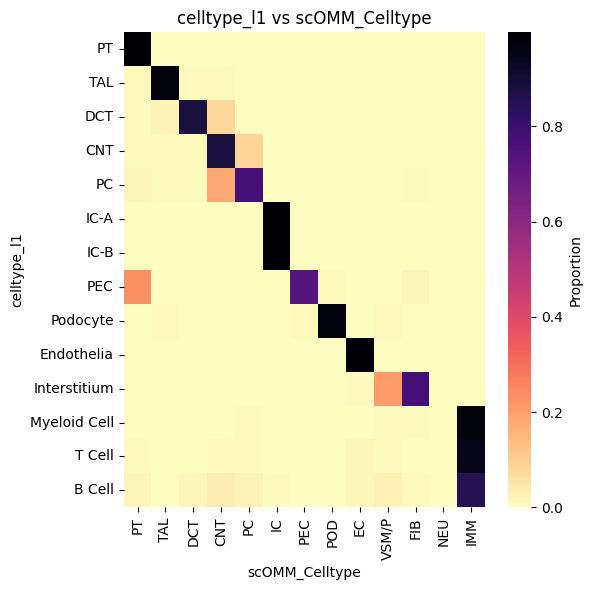

In [ ]:
row_order = [
    "PT",           # Proximal tubule
    "TAL",          # Thick ascending limb
    "DCT",          # Distal convoluted tubule
    "CNT",          # Connecting tubule
    "PC",           # Principal cells
    "IC-A",         # Intercalated A
    "IC-B",         # Intercalated B
    "PEC",          # Parietal epithelial cells
    "Podocyte",     # Podocytes
    "Endothelia",   # Endothelial cells
    "Interstitium", # Stromal/fibroblasts
    "Myeloid Cell", # Myeloid immune cells
    "T Cell",       # T lymphocytes
    "B Cell",       # B lymphocytes
]
col_order = [
    "PT",       # Proximal tubule
    "TAL",      # Thick ascending limb
    "DCT",      # Distal convoluted tubule
    "CNT",      # Connecting tubule
    "PC",       # Principal cells
    "IC",       # Intercalated cells
    "PEC",      # Parietal epithelial cells
    "POD",      # Podocytes
    "EC",       # Endothelial cells
    "VSM/P",    # Vascular smooth muscle / pericytes
    "FIB",      # Fibroblasts
    "NEU",      # Neurons / neural elements
    "IMM",      # Immune (mixed, umbrella category)
]

obs_crosstab_heatmap(
    adata,
    "celltype_l1",
    "scOMM_Celltype",
    row_order=row_order,
    col_order=col_order,figsize=(6,6), annot=False, normalize=True
)
plt.savefig(f'figs/ann_comparison_l1.pdf', bbox_inches='tight', dpi=400)
plt.savefig(f'figs/ann_comparison_l1.png', bbox_inches='tight', dpi=400)

2025-09-04 20:17:33,066 | INFO | maxp pruned
2025-09-04 20:17:33,082 | INFO | cmap pruned
2025-09-04 20:17:33,082 | INFO | kern dropped
2025-09-04 20:17:33,084 | INFO | post pruned
2025-09-04 20:17:33,085 | INFO | FFTM dropped
2025-09-04 20:17:33,089 | INFO | GPOS pruned
2025-09-04 20:17:33,094 | INFO | GSUB pruned
2025-09-04 20:17:33,105 | INFO | glyf pruned
2025-09-04 20:17:33,108 | INFO | Added gid0 to subset
2025-09-04 20:17:33,109 | INFO | Added first four glyphs to subset
2025-09-04 20:17:33,110 | INFO | Closing glyph list over 'GSUB': 61 glyphs before
2025-09-04 20:17:33,110 | INFO | Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'V', 'Y', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'idieresis', 'j', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'plus', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'y', '

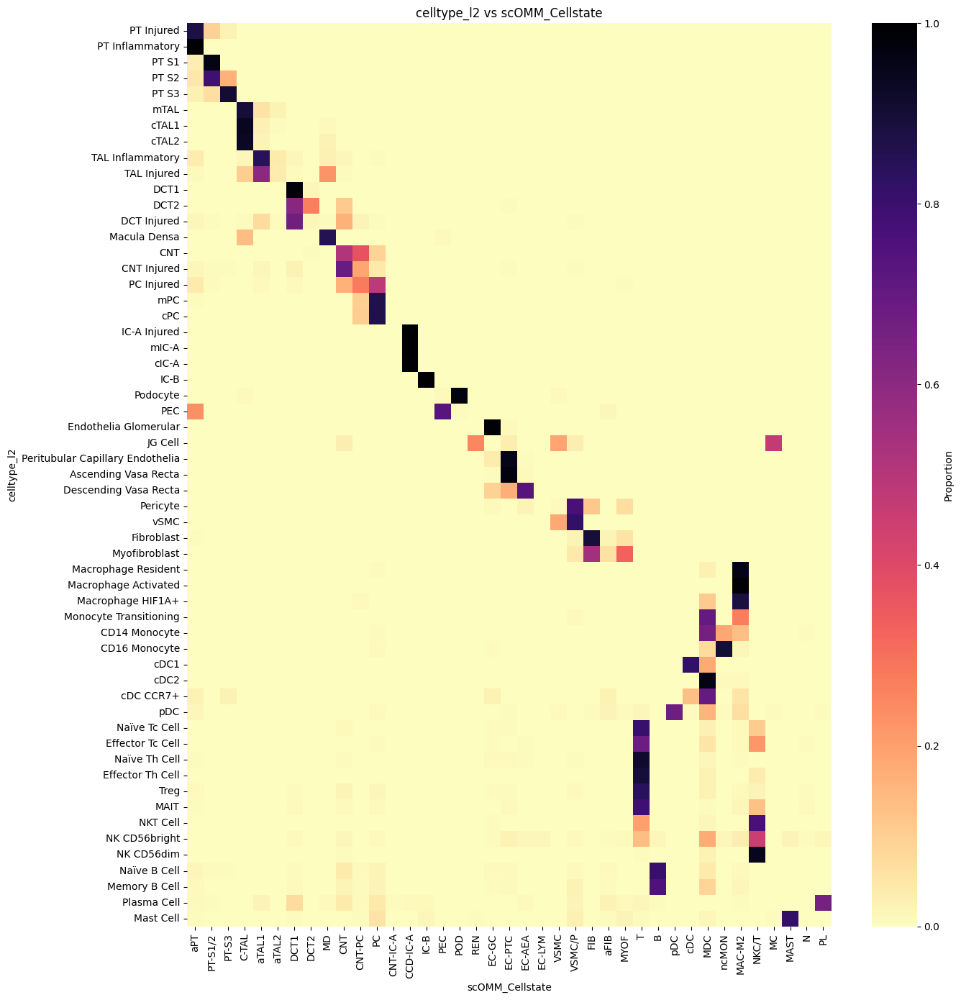

In [ ]:
row_order_lvl2 = [
    # Proximal tubule
        "PT Injured",
    "PT Inflammatory",
    "PT S1",
    "PT S2",
    "PT S3",

    
    # Thick ascending limb
    "mTAL",
    "cTAL1",
    "cTAL2",
    "TAL Inflammatory",
    "TAL Injured",
    
    # Distal nephron
    "DCT1",
    "DCT2",
    "DCT Injured",
    "Macula Densa",
    
    # CNT / Collecting duct
    "CNT",
    "CNT Injured",
    "PC Injured",
    "mPC",
    "cPC",
    "IC-A Injured",
    "mIC-A",
    "cIC-A",
    "IC-B",
    
    # Glomerulus
    "Podocyte",
    "PEC",
    "Endothelia Glomerular",
    "JG Cell",
    
    # Endothelium / Vasculature
    "Peritubular Capillary Endothelia",
    "Ascending Vasa Recta",
    "Descending Vasa Recta",
    
    # Vascular support
    "Pericyte",
    "vSMC",
    
    # Stroma
    "Fibroblast",
    "Myofibroblast",
    
    # Macrophage/Monocytes
    "Macrophage Resident",
    "Macrophage Activated",
    "Macrophage HIF1A+",
    "Monocyte Transitioning",
    "CD14 Monocyte",
    "CD16 Monocyte",
    
    # Dendritic cells
    "cDC1",
    "cDC2",
    "cDC CCR7+",
    "pDC",
    
    # T/NK
    "Naïve Tc Cell",
    "Effector Tc Cell",
    "Naïve Th Cell",
    "Effector Th Cell",
    "Treg",
    "MAIT",
    "NKT Cell",
    "NK CD56bright",
    "NK CD56dim",
    
    # B lineage
    "Naïve B Cell",
    "Memory B Cell",
    "Plasma Cell",
    
    # Mast / others
    "Mast Cell",
]
col_order_lvl2 = [
    # Proximal tubule
    "aPT",
    "PT-S1/2",
    "PT-S3",
    
    # TAL
    "C-TAL",
    "aTAL1",
    "aTAL2",
    
    # Distal
    "DCT1",
    "DCT2",
    "MD",
    
    # CNT / CD
    "CNT",
    "CNT-PC",
    "PC",
    "CNT-IC-A",
    "CCD-IC-A",
    "IC-B",
    
    # Glomerulus
    "PEC",
    "POD",
    "REN",   # renin JG cell
    
    # Endothelium
    "EC-GC",
    "EC-PTC",
    "EC-AEA",
    "EC-LYM",
    
    # Vasculature / smooth muscle
    "VSMC",
    "VSMC/P",
    
    # Stroma
    "FIB",
    "aFIB",
    "MYOF",
    
    # Immune
    "T",
    "B",
    "pDC",
    "cDC",
    "MDC",
    "ncMON",
    "MAC-M2",
    "NKC/T",
    "MC",
    "MAST",
    "N",
    "PL",
    
    # Catch-all
    # np.nan,
]


obs_crosstab_heatmap(
    adata,
    "celltype_l2",
    "scOMM_Cellstate",
    row_order=row_order_lvl2,
    col_order=col_order_lvl2,figsize=(14,14), annot=False, normalize=True
)
plt.savefig(f'figs/ann_comparison_l2.pdf', bbox_inches='tight', dpi=400)
plt.savefig(f'figs/ann_comparison_l2.png', bbox_inches='tight', dpi=400)

... storing 'scOMM_Cellstate' as categorical


Figure size= (14, 14) dpi= 100.0 Scale factor = 33.28860253559178


/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_269042/3880658012.py:102: RuntimeWarning: invalid value encountered in divide
  norm_direction = direction / np.linalg.norm(direction)


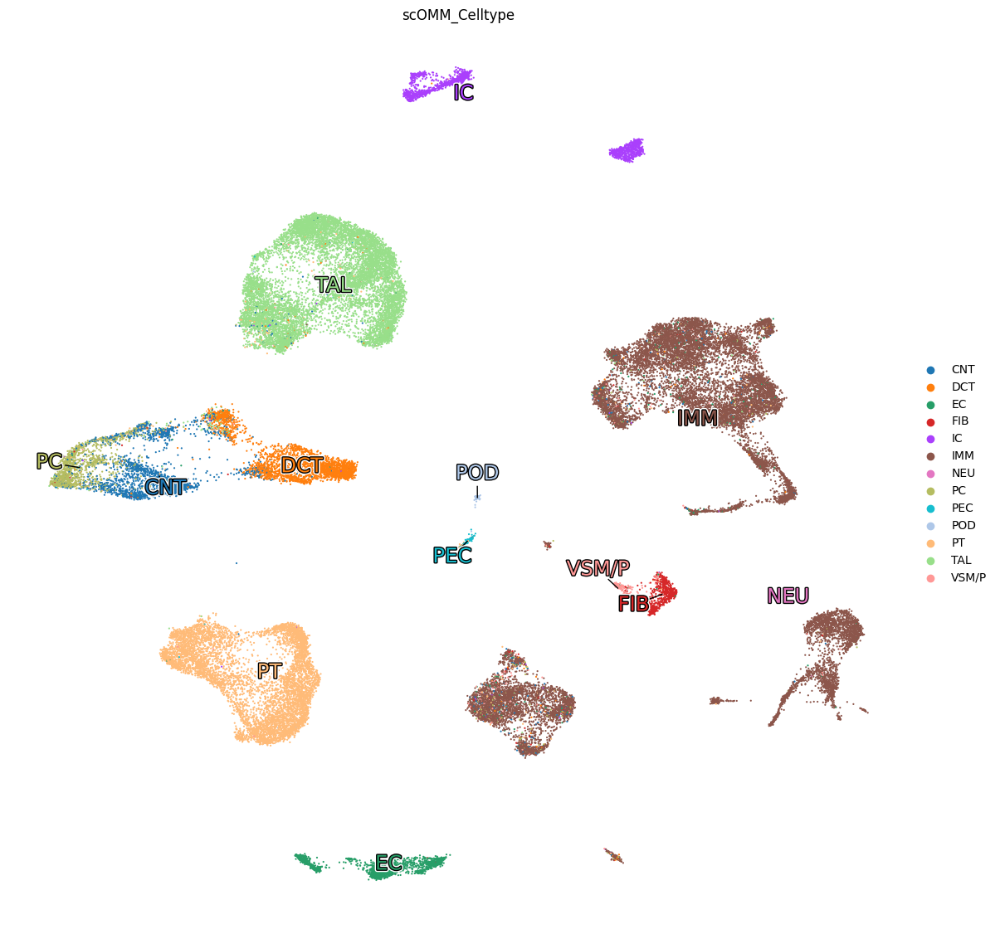

Figure size= (18, 18) dpi= 100.0 Scale factor = 42.799631831475146


/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_269042/3880658012.py:102: RuntimeWarning: invalid value encountered in divide
  norm_direction = direction / np.linalg.norm(direction)


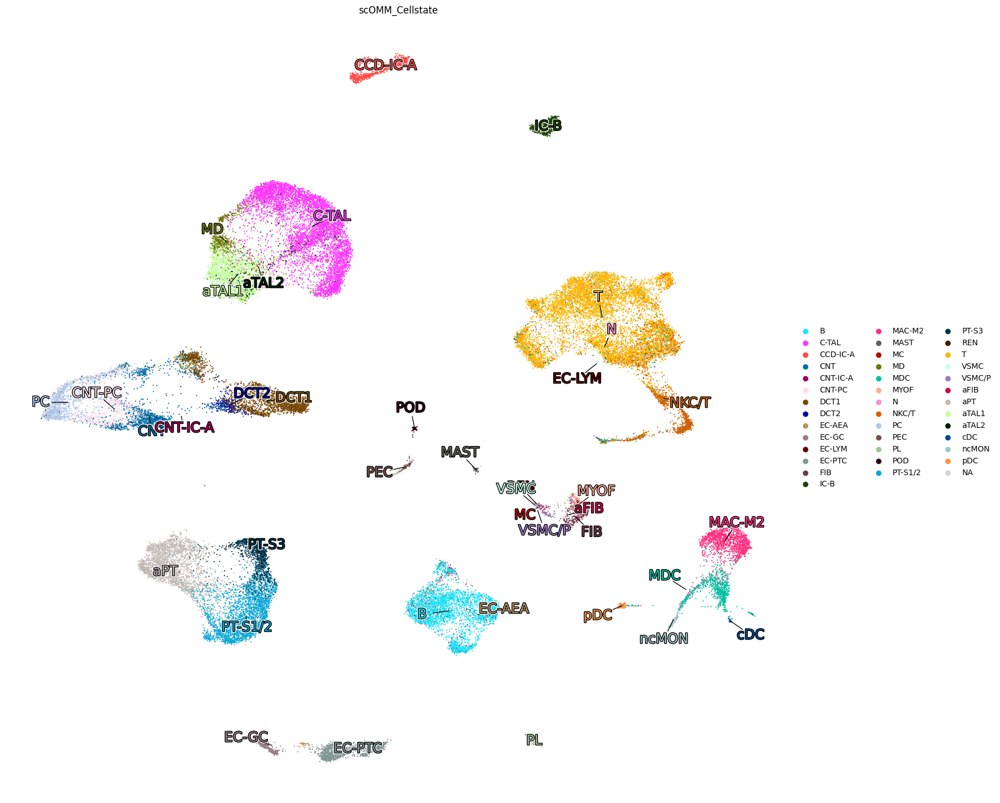

In [ ]:
umap_refined(adata,
                'X_umap',
                'scOMM_Celltype',
                 size=10,
                label_size = 70,
                width_in_inches = 14,
                height_in_inches = 14,
                max_iterations=1,
                displacement=0.005)
plt.savefig('umap_rna_l1_original.png', dpi=400, bbox_inches='tight')
plt.show()
umap_refined(adata,
                'X_umap',
                'scOMM_Cellstate',
                 size=10,
                label_size = 70,
                width_in_inches = 18,
                height_in_inches = 18,
                max_iterations=2,
                displacement=0.000005)
plt.savefig('umap_rna_l2_originial.png', dpi=400, bbox_inches='tight')

Figure size= (14, 14) dpi= 100.0 Scale factor = 30.456188352031752


/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_269042/3880658012.py:102: RuntimeWarning: invalid value encountered in divide
  norm_direction = direction / np.linalg.norm(direction)


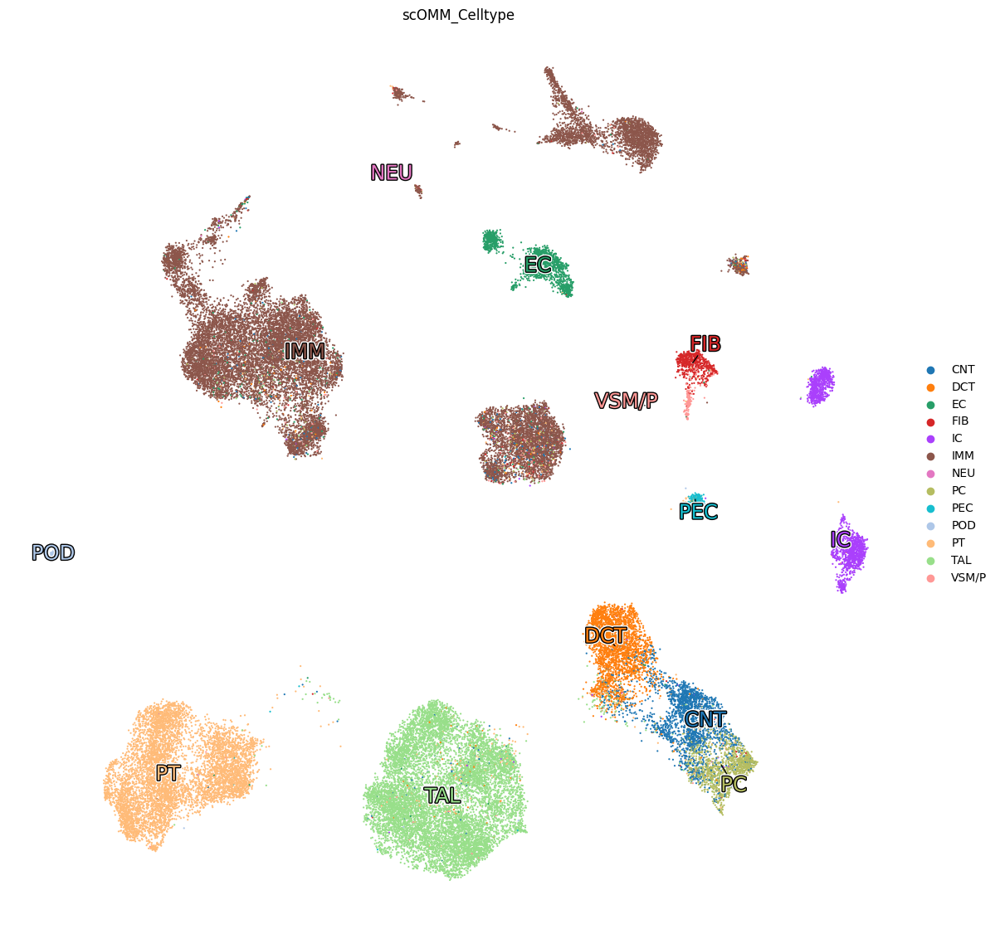

Figure size= (18, 18) dpi= 100.0 Scale factor = 39.157956452612254


/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_269042/3880658012.py:102: RuntimeWarning: invalid value encountered in divide
  norm_direction = direction / np.linalg.norm(direction)


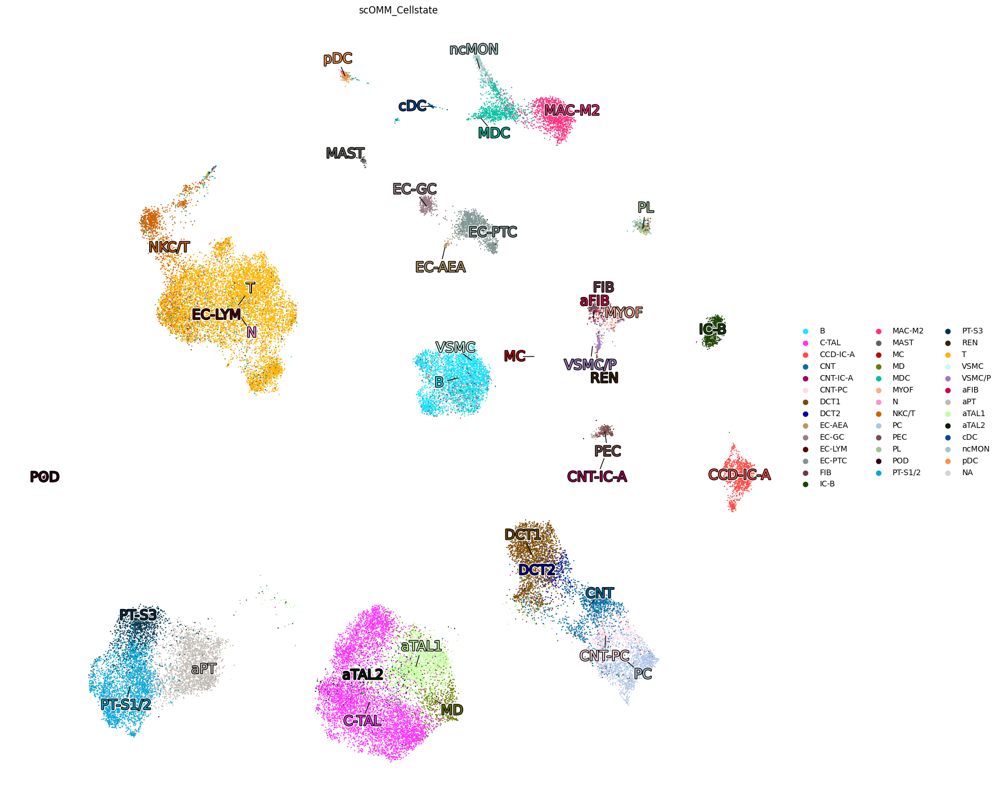

In [ ]:
umap_refined(adata,
                'X_umap__all',
                'scOMM_Celltype',
                 size=10,
                label_size = 70,
                width_in_inches = 14,
                height_in_inches = 14,
                max_iterations=1,
                displacement=0.005)
plt.savefig('umap_rna_l1.png', dpi=400, bbox_inches='tight')
plt.show()
umap_refined(adata,
                'X_umap__all',
                'scOMM_Cellstate',
                 size=10,
                label_size = 70,
                width_in_inches = 18,
                height_in_inches = 18,
                max_iterations=2,
                displacement=0.000005)
plt.savefig('umap_rna_l2.png', dpi=400, bbox_inches='tight')

Figure size= (14, 14) dpi= 100.0 Scale factor = 29.191314627509115


/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_269042/3880658012.py:102: RuntimeWarning: invalid value encountered in divide
  norm_direction = direction / np.linalg.norm(direction)


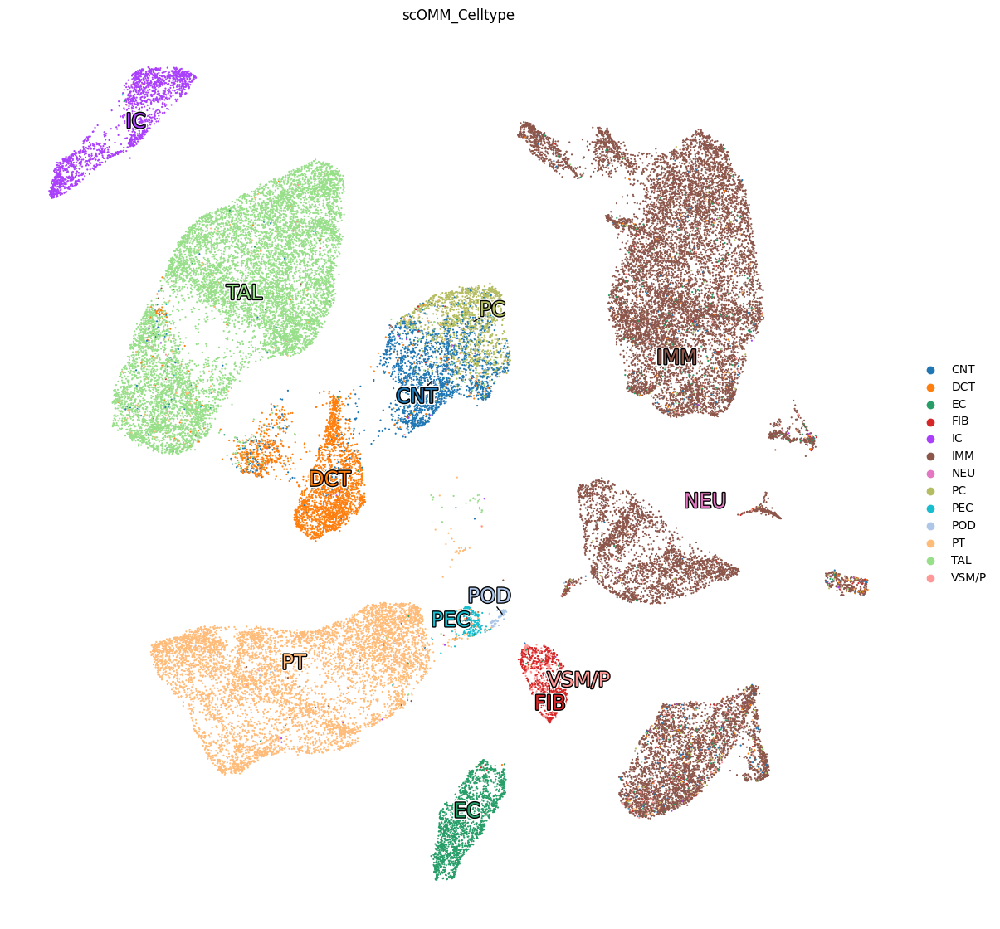

Figure size= (18, 18) dpi= 100.0 Scale factor = 37.53169023536886


/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_269042/3880658012.py:102: RuntimeWarning: invalid value encountered in divide
  norm_direction = direction / np.linalg.norm(direction)


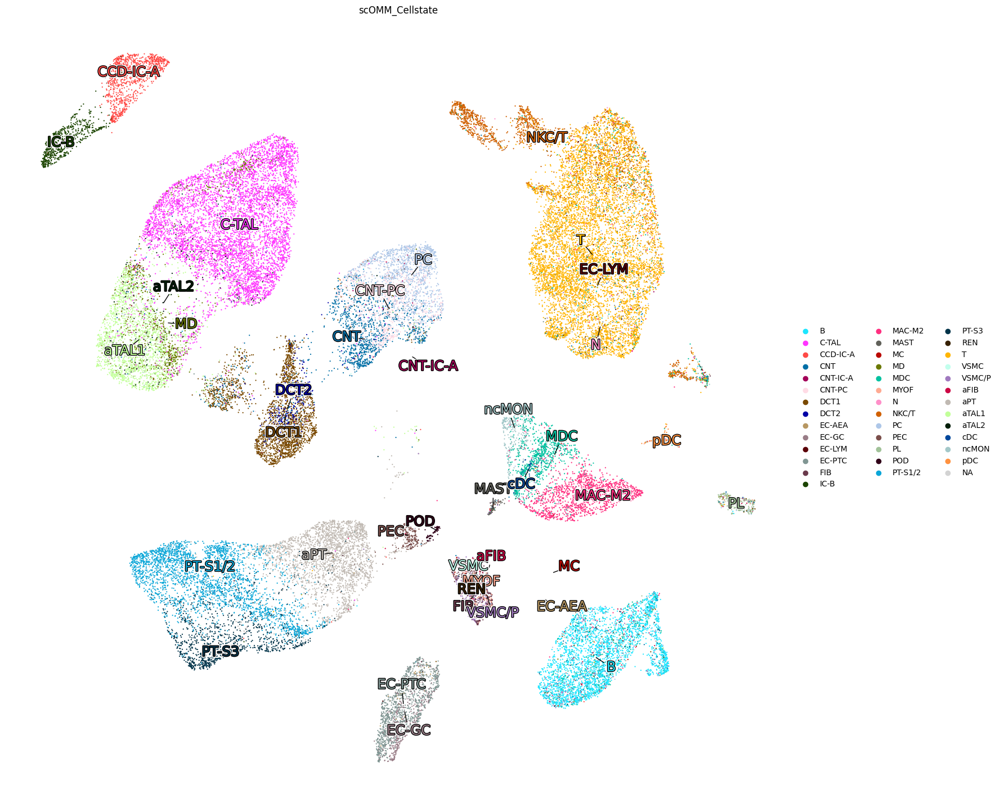

In [ ]:
umap_refined(adata,
                'X_umap__atac_spectral_mnc',
                'scOMM_Celltype',
                 size=10,
                label_size = 70,
                width_in_inches = 14,
                height_in_inches = 14,
                max_iterations=1,
                displacement=0.005)
plt.savefig('umap_atac_l1.png', dpi=400, bbox_inches='tight')
plt.show()
umap_refined(adata,
                'X_umap__atac_spectral_mnc',
                'scOMM_Cellstate',
                 size=10,
                label_size = 70,
                width_in_inches = 18,
                height_in_inches = 18,
                max_iterations=2,
                displacement=0.000005)
plt.savefig('umap_atac_l2.png', dpi=400, bbox_inches='tight')

Figure size= (14, 14) dpi= 100.0 Scale factor = 29.364723579240152


/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_269042/3880658012.py:102: RuntimeWarning: invalid value encountered in divide
  norm_direction = direction / np.linalg.norm(direction)


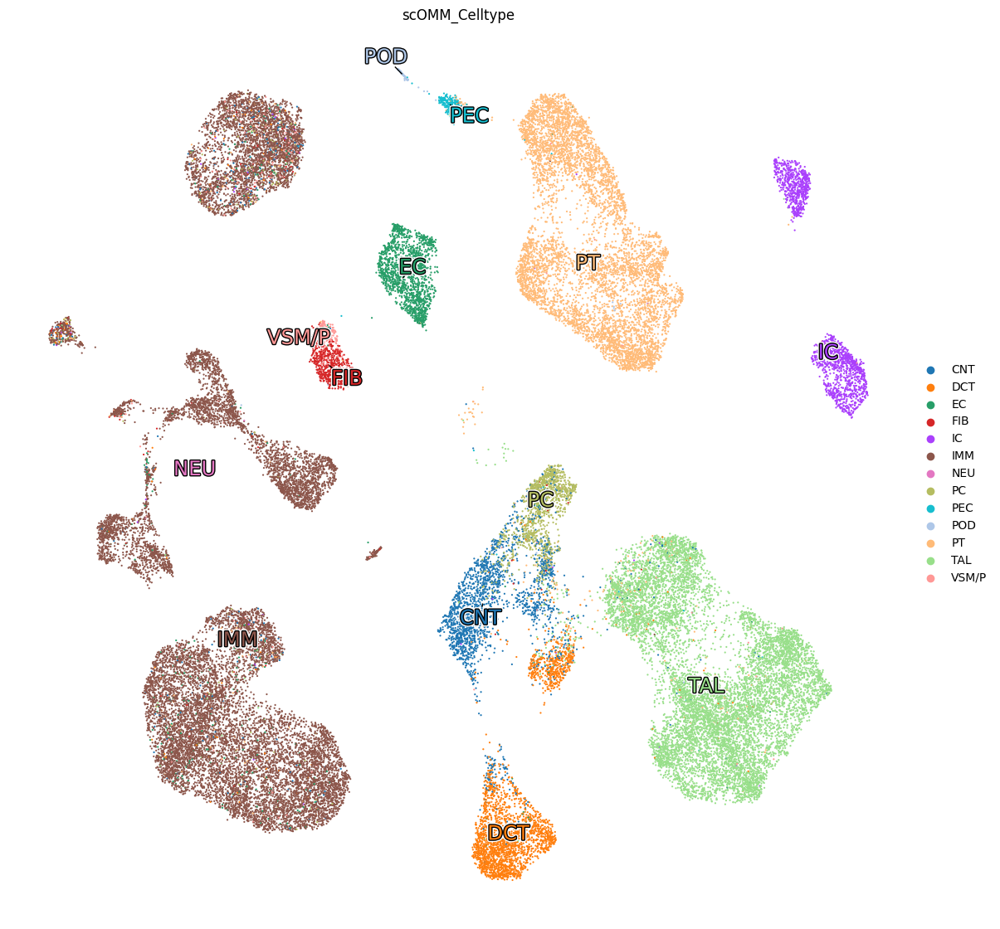

Figure size= (18, 18) dpi= 100.0 Scale factor = 37.754644601880194


/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_269042/3880658012.py:102: RuntimeWarning: invalid value encountered in divide
  norm_direction = direction / np.linalg.norm(direction)


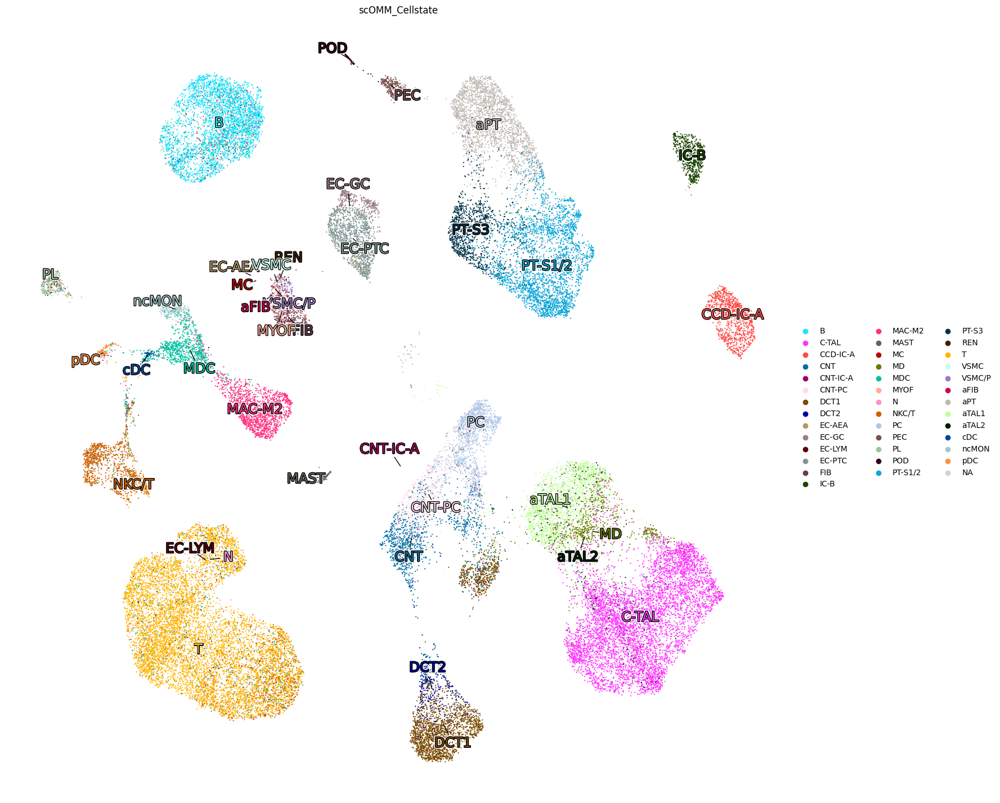

In [ ]:
umap_refined(adata,
                'X_umap__multimodal_spectral_mnc',
                'scOMM_Celltype',
                 size=10,
                label_size = 70,
                width_in_inches = 14,
                height_in_inches = 14,
                max_iterations=1,
                displacement=0.005)
plt.savefig('umap_vertical_l1.png', dpi=400, bbox_inches='tight')
plt.show()
umap_refined(adata,
                'X_umap__multimodal_spectral_mnc',
                'scOMM_Cellstate',
                 size=10,
                label_size = 70,
                width_in_inches = 18,
                height_in_inches = 18,
                max_iterations=2,
                displacement=0.000005)
plt.savefig('umap_vertical_l2.png', dpi=400, bbox_inches='tight')

In [ ]:
adata

AnnData object with n_obs × n_vars = 45553 × 23368
    obs: 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'self_reported_ethnicity_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'tissue_type', 'tissue_ontology_term_id', 'library_id', 'celltype_l1', 'celltype_l2', 'n_umi', 'n_genes', 'percent_mitochrondrial', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'scOMM_Celltype', 'scOMM_Celltype_score', 'scOMM_Cellstate', 'scOMM_Cellstate_score'
    var: 'features', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type', 'gene_symbols'
    uns: 'celltype_l1_colors', 'celltype_l2_colors', 'citation', 'default_embedding', 'organism', 'organism_ontology_term_id', 'schema_reference', 'schema_version', 'title', 'scOMM_Cellstate_colors', 'scOMM_Celltype_colors', 'neighbors__

In [ ]:
pd.DataFrame(adata.obsm['X_scVI__atac_spectral_mnc'], index = adata.obs.index).to_csv('csv_metrics/Horizontal_ATAC.csv')
pd.DataFrame(adata.obsm['X_scVI__multimodal_spectral_mnc'], index = adata.obs.index).to_csv('csv_metrics/Vertical.csv')
pd.DataFrame(adata.obsm['X_scVI__all'], index = adata.obs.index).to_csv('csv_metrics/Horizontal_RNA.csv')


In [ ]:
"""
Compute Silhouette and Binary-LISI from 3 latent CSVs (same cells, same labels),
then plot heatmaps of per-label means across latents.

- Inputs (CSV with index = cell IDs, columns = latent dims):
    csv/Horizontal_ATAC.csv         -> adata.obsm['X_spectral_mnn']
    csv/Vertical.csv                -> adata.obsm['X_spectral_mnn_VERTICAL']
    csv/Horizontal_RNA.csv          -> adata.obsm['X_scVI']

- Labels:
    Provided from an AnnData `adata`, or load as a CSV/vector aligned to these indices.

Author: scVERSER
"""

from __future__ import annotations
import numpy as np
import pandas as pd
from pathlib import Path
from typing import Dict, Tuple, Optional, List
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_samples
import seaborn as sns
import matplotlib.pyplot as plt


# ------------------------ core metrics ------------------------

def make_knn_indices(X: np.ndarray, k: int = 15, metric: str = "euclidean") -> np.ndarray:
    """
    Build neighbor indices for each row in X (excluding self).
    If n <= k, uses as many as available (k' = n-1).

    Returns
    -------
    indices : (n, k_eff) int array
    """
    n = X.shape[0]
    if n <= 1:
        return np.zeros((n, 0), dtype=int)
    k_eff = min(k, n - 1)
    nn = NearestNeighbors(n_neighbors=k_eff + 1, metric=metric)  # +1 to drop self
    nn.fit(X)
    ind = nn.kneighbors(return_distance=False)
    # drop self (neighbor equal to row index)
    out = []
    for i in range(n):
        row = ind[i]
        row_wo = row[row != i]
        out.append(row_wo[:k_eff])
    return np.vstack(out)


def binary_lisi_from_indices(indices: np.ndarray, labels: np.ndarray) -> np.ndarray:
    """
    Binary LISI = proportion of neighbors with the same label (per cell).
    """
    if indices.size == 0:
        return np.full(labels.shape[0], np.nan, dtype=float)
    n = indices.shape[0]
    same = (labels[indices] == labels[np.arange(n)][:, None])
    return same.mean(axis=1).astype(float)


def compute_per_cell_metrics(
    X: np.ndarray,
    labels: np.ndarray,
    *,
    k: int = 15,
    metric: str = "euclidean",
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Returns
    -------
    lisi : (n,) float
    sil  : (n,) float
    """
    # LISI
    knn = make_knn_indices(X, k=k, metric=metric)
    lisi = binary_lisi_from_indices(knn, labels)

    # Silhouette (needs >=2 classes overall)
    unique = pd.unique(labels)
    if len(unique) >= 2:
        sil = silhouette_samples(X, labels, metric=metric).astype(float)
    else:
        sil = np.full(X.shape[0], np.nan, dtype=float)

    return lisi, sil


# ------------------------ aggregation & plotting ------------------------

def agg_by_label(values: np.ndarray, labels: np.ndarray, label_levels: Optional[List[str]] = None
                 ) -> Tuple[pd.Series, pd.Series]:
    """
    Aggregate a per-cell vector into mean per label and counts.
    """
    s = pd.Series(values, index=pd.Index(range(values.shape[0]), name="cell"))
    df = pd.DataFrame({"val": s, "lab": labels})
    df = df.dropna(subset=["val"])
    if label_levels is None:
        label_levels = sorted(pd.unique(labels.astype(str)))
    mean = df.groupby("lab", observed=True)["val"].mean().reindex(label_levels)
    cnt = df.groupby("lab", observed=True)["val"].size().reindex(label_levels).fillna(0).astype(int)
    return mean, cnt


def build_metric_matrices_from_csvs(
    csv_map: Dict[str, str],
    labels: pd.Series,
    *,
    k: int = 15,
    metric: str = "euclidean",
    min_cells: int = 10,
) -> Tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """
    Compute per-cell metrics for each latent from CSV, then aggregate by label.

    Parameters
    ----------
    csv_map : dict
        { latent_name: csv_path }.
    labels : pd.Series
        Index must match the CSV indices (cell IDs). Values = label categories.
    k, metric : neighbors/silhouette parameters.
    min_cells : minimum cells per label to report; below -> NaN.

    Returns
    -------
    lisi_mean : (labels x latents) DataFrame
    lisi_cnt  : (labels x latents) DataFrame
    sil_mean  : (labels x latents) DataFrame
    sil_cnt   : (labels x latents) DataFrame
    """
    # Load and align
    latents: Dict[str, np.ndarray] = {}
    first_index: Optional[pd.Index] = None
    for name, path in csv_map.items():
        df = pd.read_csv(path, index_col=0)
        if first_index is None:
            first_index = df.index
        else:
            # align to first index to guarantee same order
            if not df.index.equals(first_index):
                df = df.reindex(first_index)
        latents[name] = df.to_numpy(dtype=np.float32)

    # Align labels to index order
    if not labels.index.equals(first_index):
        labels = labels.reindex(first_index)
    labels_np = labels.astype(str).to_numpy()

    # Label levels (fixed across matrices)
    if pd.api.types.is_categorical_dtype(labels):
        label_levels = list(labels.cat.categories)
    else:
        label_levels = sorted(pd.unique(labels.astype(str)))

    # Compute metrics per latent and aggregate
    lisi_mean_cols = []
    lisi_cnt_cols = []
    sil_mean_cols = []
    sil_cnt_cols = []

    for name, X in latents.items():
        lisi, sil = compute_per_cell_metrics(X, labels_np, k=k, metric=metric)
        m_lisi, c_lisi = agg_by_label(lisi, labels_np, label_levels)
        m_sil,  c_sil  = agg_by_label(sil, labels_np, label_levels)

        # apply min_cells threshold
        m_lisi = m_lisi.mask(c_lisi < min_cells, np.nan)
        m_sil  = m_sil.mask(c_sil < min_cells, np.nan)
        c_lisi = c_lisi.mask(c_lisi < min_cells, np.nan)
        c_sil  = c_sil.mask(c_sil < min_cells, np.nan)

        lisi_mean_cols.append(m_lisi.rename(name))
        lisi_cnt_cols.append(c_lisi.rename(name))
        sil_mean_cols.append(m_sil.rename(name))
        sil_cnt_cols.append(c_sil.rename(name))

    lisi_mean = pd.concat(lisi_mean_cols, axis=1)
    lisi_cnt  = pd.concat(lisi_cnt_cols, axis=1)
    sil_mean  = pd.concat(sil_mean_cols, axis=1)
    sil_cnt   = pd.concat(sil_cnt_cols, axis=1)

    # drop rows entirely NaN (no label reached min_cells in any latent)
    keep = ~(sil_mean.isna().all(axis=1) & lisi_mean.isna().all(axis=1))
    return lisi_mean.loc[keep], lisi_cnt.loc[keep], sil_mean.loc[keep], sil_cnt.loc[keep]


def plot_heatmap(
    matrix: pd.DataFrame,
    counts: Optional[pd.DataFrame] = None,
    *,
    metric_base: str = "silhouette",  # or "binary_lisi"
    title: Optional[str] = None,
    annotate: bool = True,
    fmt: str = ".2f",
    figsize: Optional[Tuple[float, float]] = None,
):
    """
    Compact annotated heatmap for matrix (labels x latents).
    """
    if metric_base.lower() == "silhouette":
        vmin, vmax, center, cmap, cbar = -1.0, 1.0, 0.0, "Blues", "Mean silhouette"
        vmin=np.min(matrix)
        vmax=np.max(matrix)
    else:
        vmin, vmax, center, cmap, cbar = 0.0, 1.0, None, "Greens", "Mean binary LISI"
        vmin=np.min(matrix)
        vmax=np.max(matrix)
    if figsize is None:
        figsize = (max(6, 1 + 1.0 * matrix.shape[1]), max(6, 0.45 * matrix.shape[0]))

    plt.figure(figsize=figsize)
    ax = sns.heatmap(
        matrix, cmap=cmap, vmin=vmin, vmax=vmax, center=center,
        annot=False, linewidths=0.5, linecolor="white",
        cbar_kws={"label": cbar}
    )
    if title:
        ax.set_title(title, fontsize=12)

    if annotate:
        for i in range(matrix.shape[0]):
            for j in range(matrix.shape[1]):
                val = matrix.iat[i, j]
                if np.isfinite(val):
                    text = format(val, fmt)
                    if counts is not None and counts.shape == matrix.shape:
                        n = counts.iat[i, j]
                        if pd.notna(n):
                            text = f"{text}\n(n={int(n)})"
                    ax.text(j + 0.5, i + 0.5, text,
                            ha="center", va="center", fontsize=8, color="black")

    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
import matplotlib.patheffects as path_effects

def plot_heatmap(
    matrix: pd.DataFrame,
    counts: Optional[pd.DataFrame] = None,
    *,
    metric_base: str = "silhouette",  # or "binary_lisi"
    title: Optional[str] = None,
    annotate: bool = True,
    fmt: str = ".2f",
    figsize: Optional[Tuple[float, float]] = None,
    outline: bool = True,   # <---- NEW
    bold: bool = True,  # <---- NEW

):
    """
    Compact annotated heatmap for matrix (labels x latents).
    """
    if metric_base.lower() == "silhouette":
        vmin, vmax, center, cmap, cbar = -1.0, 1.0, 0.0, "Blues_r", "Mean silhouette"
        vmin=0#np.min(matrix)
        vmax=0.6#np.max(matrix)
    else:
        vmin, vmax, center, cmap, cbar = 0.0, 1.0, None, "Greens_r", "Mean binary LISI"
        vmin=np.min(matrix)
        vmax=np.max(matrix)
    if figsize is None:
        figsize = (max(1 + 0.8 * matrix.shape[1],6), max(0.4 * matrix.shape[0], 3))

    plt.figure(figsize=figsize)
    ax = sns.heatmap(
        matrix, cmap=cmap, #vmin=vmin, vmax=vmax, center=center,
        annot=True, linewidths=0.5,fmt='.2f', #linecolor="white",
        cbar_kws={"label": cbar}
    )
    if title:
        ax.set_title(title, fontsize=12)

    # if annotate:
    #     for i in range(matrix.shape[0]):
    #         for j in range(matrix.shape[1]):
    #             val = matrix.iat[i, j]
    #             if np.isfinite(val):
    #                 text = format(val, fmt)
    #                 if counts is not None and counts.shape == matrix.shape:
    #                     n = counts.iat[i, j]
    #                     if pd.notna(n):
    #                         text = f"{text}\n(n={int(n)})"
    #                     txt = ax.text(
    #                                 j + 0.5, i + 0.5, text,
    #                                 ha="center", va="center",
    #                                 fontsize=9,
    #                                 color="black",
    #                                 fontweight="bold" if bold else "normal"
    #                             )
    #                 if outline:
    #                     txt.set_path_effects([
    #                         path_effects.Stroke(linewidth=2.3, foreground="white"),
    #                         path_effects.Normal(),
    #                     ])


    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    # plt.show()




In [ ]:
csv_map = {
    "scVI RNA":    "csv_metrics/Horizontal_RNA.csv",
    "Spectral ATAC":  "csv_metrics/Horizontal_ATAC.csv",
    "Multi-Spectral":          "csv_metrics/Vertical.csv",
}
# Compute metrics & build matrices
ann = 'scOMM_Celltype'
labels = adata.obs["scOMM_Celltype"]   # <- Series, not a string
lisi_mean, lisi_cnt, sil_mean, sil_cnt = build_metric_matrices_from_csvs(
    csv_map=csv_map,
    labels=labels,
    k=50,
    metric="euclidean",
    min_cells=10,
)


/tmp/ipykernel_269042/945294102.py:155: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(labels):


2025-09-04 20:26:42,049 | INFO | maxp pruned
2025-09-04 20:26:42,061 | INFO | cmap pruned
2025-09-04 20:26:42,062 | INFO | kern dropped
2025-09-04 20:26:42,063 | INFO | post pruned
2025-09-04 20:26:42,063 | INFO | FFTM dropped
2025-09-04 20:26:42,066 | INFO | GPOS pruned
2025-09-04 20:26:42,071 | INFO | GSUB pruned
2025-09-04 20:26:42,079 | INFO | glyf pruned
2025-09-04 20:26:42,080 | INFO | Added gid0 to subset
2025-09-04 20:26:42,081 | INFO | Added first four glyphs to subset
2025-09-04 20:26:42,081 | INFO | Closing glyph list over 'GSUB': 47 glyphs before
2025-09-04 20:26:42,081 | INFO | Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'I', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'V', 'a', 'b', 'c', 'e', 'eight', 'five', 'four', 'h', 'hyphen', 'i', 'l', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'zero']
2025-09-04 20:26:42,083 | INFO | Glyph IDs:   [0, 1, 2, 3, 16, 17, 18, 19, 20, 

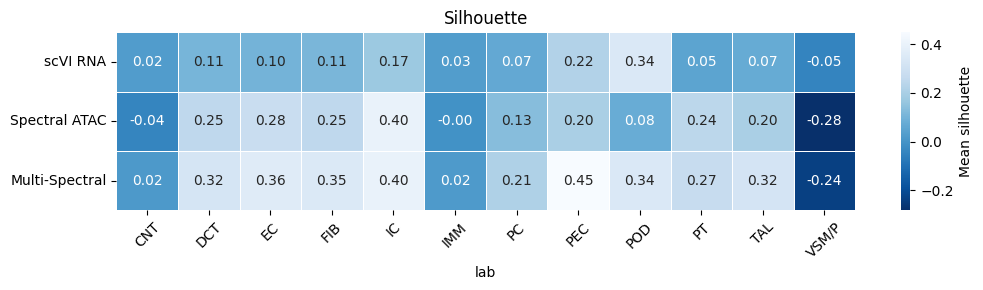

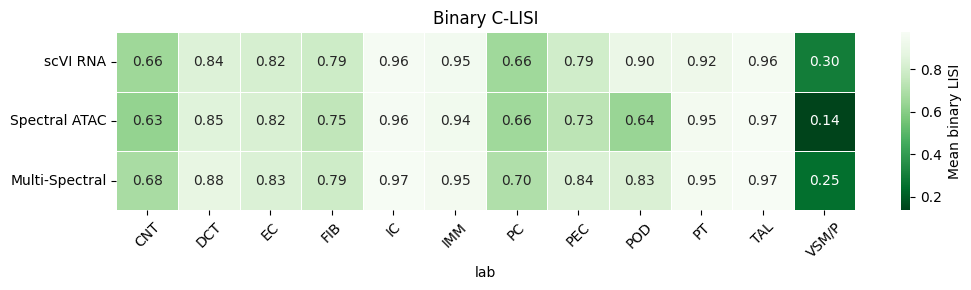

In [ ]:

# ------------------------ example usage ------------------------

# if __name__ == "__main__":
    # INPUTS: adjust paths if needed


# Load your labels from AnnData (preferred) or a CSV.
# Example with AnnData:
#   labels = adata.obs["scOMM_Celltype"]  # or "scOMM_Cellstate"
# If you only have a CSV with labels aligned to indices:
#   labels = pd.read_csv("labels.csv", index_col=0)["label"]

# ---- replace this with your actual labels series from adata.obs ----
# labels = adata.obs["scOMM_Celltype"]
# raise SystemExit("Replace the 'labels' assignment with your adata.obs[...] series and rerun.")



metric_base="silhouette"
# Plot heatmaps
plot_heatmap(
    sil_mean.T, counts=sil_cnt.T,
    metric_base="silhouette",
    title="Silhouette",
)
plt.savefig(f'figs/heatmap_metrics_vertical/{ann}_{metric_base}.png', bbox_inches='tight', dpi=400)
plt.savefig(f'figs/heatmap_metrics_vertical/{ann}_{metric_base}.pdf', bbox_inches='tight', dpi=400)

metric_base='binary_lisi'
plot_heatmap(
    lisi_mean.T, counts=lisi_cnt.T,
    metric_base="binary_lisi",
    title="Binary C-LISI"
)
plt.savefig(f'figs/heatmap_metrics_vertical/{ann}_{metric_base}.png', bbox_inches='tight', dpi=400)
plt.savefig(f'figs/heatmap_metrics_vertical/{ann}_{metric_base}.pdf', bbox_inches='tight', dpi=400)

In [ ]:
csv_map = {
    "scVI RNA":    "csv_metrics/Horizontal_RNA.csv",
    "Spectral ATAC":  "csv_metrics/Horizontal_ATAC.csv",
    "Multi-Spectral":          "csv_metrics/Vertical.csv",
}
# Compute metrics & build matrices
ann = 'scOMM_Cellstate'
labels = adata.obs["scOMM_Cellstate"]   # <- Series, not a string
lisi_mean, lisi_cnt, sil_mean, sil_cnt = build_metric_matrices_from_csvs(
    csv_map=csv_map,
    labels=labels,
    k=50,
    metric="euclidean",
    min_cells=10,
)


/tmp/ipykernel_269042/945294102.py:155: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(labels):


2025-09-04 20:30:17,352 | INFO | maxp pruned
2025-09-04 20:30:17,361 | INFO | cmap pruned
2025-09-04 20:30:17,362 | INFO | kern dropped
2025-09-04 20:30:17,362 | INFO | post pruned
2025-09-04 20:30:17,363 | INFO | FFTM dropped
2025-09-04 20:30:17,365 | INFO | GPOS pruned
2025-09-04 20:30:17,368 | INFO | GSUB pruned
2025-09-04 20:30:17,379 | INFO | glyf pruned
2025-09-04 20:30:17,390 | INFO | Added gid0 to subset
2025-09-04 20:30:17,391 | INFO | Added first four glyphs to subset
2025-09-04 20:30:17,392 | INFO | Closing glyph list over 'GSUB': 47 glyphs before
2025-09-04 20:30:17,392 | INFO | Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'I', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'V', 'a', 'b', 'c', 'e', 'eight', 'five', 'four', 'h', 'hyphen', 'i', 'l', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'zero']
2025-09-04 20:30:17,394 | INFO | Glyph IDs:   [0, 1, 2, 3, 16, 17, 18, 19, 2

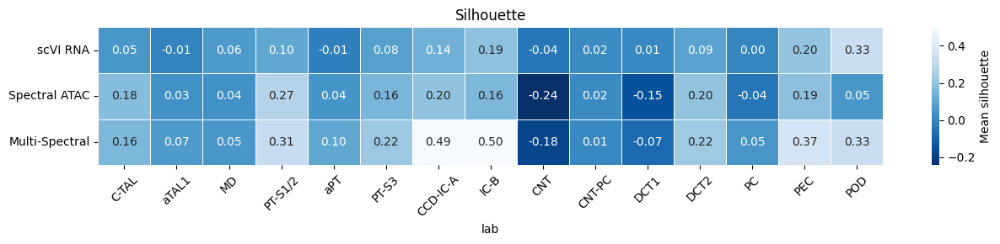

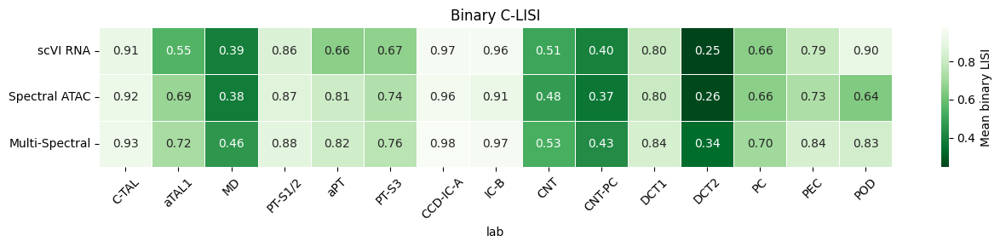

In [ ]:

# ------------------------ example usage ------------------------

# if __name__ == "__main__":
    # INPUTS: adjust paths if needed


# Load your labels from AnnData (preferred) or a CSV.
# Example with AnnData:
#   labels = adata.obs["scOMM_Celltype"]  # or "scOMM_Cellstate"
# If you only have a CSV with labels aligned to indices:
#   labels = pd.read_csv("labels.csv", index_col=0)["label"]

# ---- replace this with your actual labels series from adata.obs ----
# labels = adata.obs["scOMM_Celltype"]
# raise SystemExit("Replace the 'labels' assignment with your adata.obs[...] series and rerun.")

x_labels = [
    "C-TAL",
    "aTAL1",
    "MD",
    "PT-S1/2",
    "aPT",
    "PT-S3",
    "CCD-IC-A",
    "IC-B",
    "CNT",
    "CNT-PC",
    "DCT1",
    "DCT2",
    "PC",
    "PEC",
    "POD",
]
sil_mean_ = sil_mean.loc[x_labels]
lisi_mean_ = lisi_mean.loc[x_labels]

metric_base="silhouette"
# Plot heatmaps
plot_heatmap(
    sil_mean_.T, counts=sil_cnt.T,
    metric_base="silhouette",
    title="Silhouette",
)
plt.savefig(f'figs/heatmap_metrics_vertical/{ann}_{metric_base}.png', bbox_inches='tight', dpi=400)
plt.savefig(f'figs/heatmap_metrics_vertical/{ann}_{metric_base}.pdf', bbox_inches='tight', dpi=400)

metric_base='binary_lisi'
plot_heatmap(
    lisi_mean_.T, counts=lisi_cnt.T,
    metric_base="binary_lisi",
    title="Binary C-LISI"
)
plt.savefig(f'figs/heatmap_metrics_vertical/{ann}_{metric_base}.png', bbox_inches='tight', dpi=400)
plt.savefig(f'figs/heatmap_metrics_vertical/{ann}_{metric_base}.pdf', bbox_inches='tight', dpi=400)